# Proyek Analisis Data: E-Commerce Public Dataset
- **Nama:** Abisatya Hastarangga Pradana
- **Email:** riabitya@gmail.com
- **ID Dicoding:** abisatya_19

## Menentukan Pertanyaan Bisnis

1. Bagaimana tren penjualan e-commerce berdasarkan waktu?
2. Produk kategori apa yang paling laris dan memberikan pendapatan tertinggi? Apakah rating mempengaruhi pembelian produk?
3. Bagaimana performa pengiriman? Apakah ada keterlambatan yang signifikan?
4. Siapa pelanggan terbaik berdasarkan analisa?
5. Dari mana saja pelanggan berasal dan bagaimana distribusi geografis pesanan?

## Import Semua Packages/Library yang Digunakan

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import folium
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## Data Wrangling

### Gathering Data

1. Read data order reviews dan simpan dalam variabel `order_reviews`

In [2]:
order_reviews = pd.read_csv('/content/drive/My Drive/order_reviews_dataset.csv')
order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


2. Read data orders dan simpan dalam variabel `orders`

In [3]:
orders = pd.read_csv('/content/drive/My Drive/orders_dataset.csv')
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


3. Read data order items dan simpan dalam variabel `order_items`

In [4]:
order_items = pd.read_csv('/content/drive/My Drive/order_items_dataset.csv')
order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


4. Read data order payments dan simpan dalam variabel `order_payments`

In [5]:
order_payments = pd.read_csv('/content/drive/My Drive/order_payments_dataset.csv')
order_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


5. Read data produk dan simpan dalam variabel `products`

In [6]:
products = pd.read_csv('/content/drive/My Drive/products_dataset.csv')
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


6. Read data translasi produk kategori dan simpan dalam variabel `product_category_name_translation`

In [7]:
product_category_name_translation = pd.read_csv('/content/drive/My Drive/product_category_name_translation.csv')
product_category_name_translation.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


7. Read data seller dan simpan dalam variabel `sellers`

In [8]:
sellers = pd.read_csv('/content/drive/My Drive/sellers_dataset.csv')
sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


8. Read data customer dan simpan dalam variabel `customers`

In [9]:
customers = pd.read_csv('/content/drive/My Drive/customers_dataset.csv')
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


9. Read data geolocation dan simpan dalam variabel `geolocation`

In [10]:
geolocation = pd.read_csv('/content/drive/My Drive/geolocation_dataset.csv')
geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


**Insight:**
- Jika dilihat dari head tabel ada beberapa tabel yang memiliki missing values
- Sebenarnya beberapa tabel dapat diubah menjadi satu tabel, akan tetapi akan kita lihat lebih lanjut terkait jenis datanya terlebih dahulu

### Assessing Data

####Assessing Tabel Order Reviews

In [11]:
# Periksa ringkasan dataset dan kolomnya
order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [12]:
# Periksa missing values dalam tabel
order_reviews.isna().sum().sort_values(ascending=False)

,0
review_comment_title,87656
review_comment_message,58247
review_id,0
order_id,0
review_score,0
review_creation_date,0
review_answer_timestamp,0


In [13]:
# Periksa redudansi data dalam tabel order reviews
duplicate_value = order_reviews.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


In [14]:
# Periksa statistik tabel order reviews
order_reviews.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


####Assessing Tabel Orders

In [15]:
# Periksa ringkasan dataset dan kolomnya
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [16]:
# Periksa missing values dalam tabel
orders.isna().sum().sort_values(ascending=False)

,0
order_delivered_customer_date,2965
order_delivered_carrier_date,1783
order_approved_at,160
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_estimated_delivery_date,0


In [17]:
# Periksa redudansi data dalam tabel orders
duplicate_value = orders.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


####Assessing Tabel Order Items

In [18]:
# Periksa ringkasan dataset dan kolomnya
order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [19]:
# Periksa missing values dalam tabel
order_items.isna().sum().sort_values(ascending=False)

,0
order_id,0
order_item_id,0
product_id,0
seller_id,0
shipping_limit_date,0
price,0
freight_value,0


In [20]:
# Periksa redudansi data dalam tabel order items
duplicate_value = order_items.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


In [21]:
# Periksa redudansi di order lines
order_lines_duplicate = order_items[["order_id", "product_id"]].duplicated().sum()
print(f"Total duplikasi data di order lines: {order_lines_duplicate}")

Total duplikasi data di order lines: 10225




> Struktur tabel order item tidak menggunakan jumlah pesanan, tetapi mengulangi baris pesanan untuk setiap produk. Jadi, kita perlu menghitung jumlah total dari setiap produk yang dipesan.



In [22]:
# Periksa statistik
order_items.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


In [23]:
# Periksa baris dengan freight_value tertinggi
print(order_items.loc[order_items["freight_value"].idxmax()])

order_id               a77e1550db865202c56b19ddc6dc4d53
order_item_id                                         1
product_id             ec31d2a17b299511e7c8627be9337b9b
seller_id              257e61d3251fb5efb9daadddbc2cf7ca
shipping_limit_date                 2018-04-25 06:55:13
price                                             979.0
freight_value                                    409.68
Name: 73486, dtype: object


<Axes: xlabel='price'>

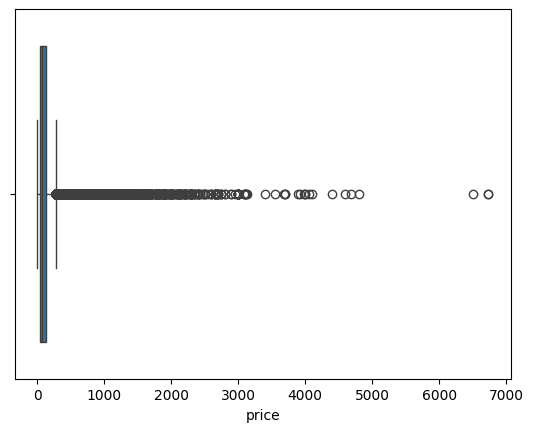

In [24]:
# Mengetahui outlier dari kolom price
sns.boxplot(x=order_items["price"])

<Axes: xlabel='freight_value'>

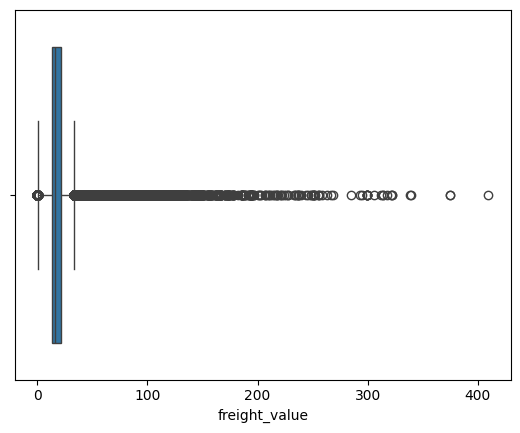

In [25]:
# Mengetahui outlier dari kolom freight_value
sns.boxplot(x=order_items["freight_value"])

#### Assessing Tabel Order Payments

In [26]:
# Periksa ringkasan dataset dan kolomnya
order_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [27]:
# Periksa missing values dalam tabel
order_payments.isna().sum().sort_values(ascending=False)

,0
order_id,0
payment_sequential,0
payment_type,0
payment_installments,0
payment_value,0


In [28]:
# Periksa redudansi data dalam tabel order payments
duplicate_value = order_payments.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


In [29]:
# Periksa statistik
order_payments.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


<Axes: xlabel='payment_value'>

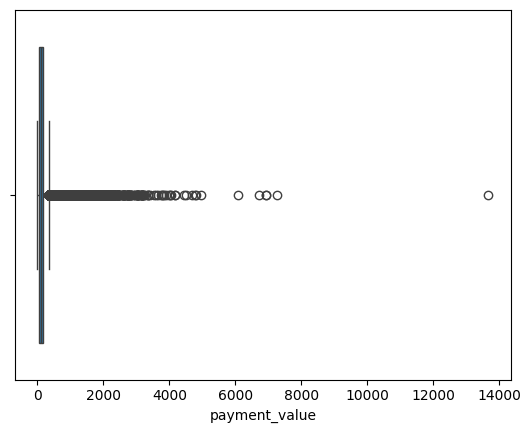

In [30]:
# Periksa outlier payment_value
sns.boxplot(x=order_payments["payment_value"])

#### Assessing Tabel Produk

In [31]:
# Periksa ringkasan dataset dan kolomnya
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [32]:
# Periksa missing values dalam tabel
products.isna().sum().sort_values(ascending=False)

,0
product_category_name,610
product_name_lenght,610
product_description_lenght,610
product_photos_qty,610
product_weight_g,2
product_length_cm,2
product_height_cm,2
product_width_cm,2
product_id,0


In [33]:
# Periksa redudansi data dalam tabel produk
duplicate_value = products.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


In [34]:
# Periksa statistik
products.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


#### Assessing Tabel Translasi Produk Kategori

In [35]:
# Periksa ringkasan dataset dan kolomnya
product_category_name_translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [36]:
# Periksa missing values dalam tabel
product_category_name_translation.isna().sum().sort_values(ascending=False)

,0
product_category_name,0
product_category_name_english,0


In [37]:
# Periksa redudansi data dalam tabel translasi produk kategori
duplicate_value = product_category_name_translation.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


In [38]:
# Periksa statistik
product_category_name_translation.describe()

,product_category_name,product_category_name_english
count,71,71
unique,71,71
top,beleza_saude,health_beauty
freq,1,1


#### Assessing Tabel Seller

In [39]:
# Periksa ringkasan dataset dan kolomnya
sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [40]:
# Periksa missing values dalam tabel
sellers.isna().sum().sort_values(ascending=False)

,0
seller_id,0
seller_zip_code_prefix,0
seller_city,0
seller_state,0


In [41]:
# Periksa redudansi data dalam tabel seller
duplicate_value = sellers.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


#### Assessing Tabel Customers

In [42]:
# Periksa ringkasan dataset dan kolomnya
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [43]:
# Periksa missing values dalam tabel
customers.isna().sum().sort_values(ascending=False)

,0
customer_id,0
customer_unique_id,0
customer_zip_code_prefix,0
customer_city,0
customer_state,0


In [44]:
# Periksa redudansi data dalam tabel customers
duplicate_value = customers.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 0


#### Assessing Tabel Geolocation

In [45]:
# Periksa ringkasan dataset dan kolomnya
geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [46]:
# Periksa missing values dalam tabel
geolocation.isna().sum().sort_values(ascending=False)

,0
geolocation_zip_code_prefix,0
geolocation_lat,0
geolocation_lng,0
geolocation_city,0
geolocation_state,0


In [47]:
# Periksa redudansi data dalam tabel geolocation
duplicate_value = geolocation.duplicated()
print(f"Total data duplikat: {duplicate_value.sum()}")

Total data duplikat: 261831


####**Insight Tahap Assessing:**

| No | Nama Tabel | Tipe Data | Missing Values | Redudansi Data | Outliers |
| ----- | --- | --- |  --- |  --- | --- |
| 1  | Order Reviews  | Kolom review_creation_date dan review_answer_timestamp seharusnya date | Kolom review_comment_title review_comment_message| - | - |
| 2 | Orders  | Terdapat 5 kolom yang seharusnya bertipe date dimulai dari order_purchase_timestamp until order_estimated_delivery_date | Kolom order_approved_at, order_delivered_carrier_date, order_delivered_customer_date | - | - |
|3 | Order Items | kolom order_item_id | - | Ubah order_item_id menjadi qty untuk mengekstrak profil baris unit per pesanan | Kolom price and freight_value |
|4 | Order Payments | - | - | - | Kolom payment_value |
|5 | Produk | - | Kolom product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm | - | - |
|6 | Produk Kategori | - | - | - | - |
|7 | Seller | Kolom seller_zip_code_prefix sebaiknya string | - | - | - |
|8 | Customer | Kolom customer_zip_code_prefix sebaiknya string| - | -| - |
|9 | Geolocation | Kolom geolocation_zip_code_prefix sebaiknya string| - |Duplikasi sebanyak 261831	| -|

### Cleaning Data

####Cleaning Tabel Order Reviews

**Handling Format data types**

In [48]:
# Ubah atribut review_creation_date menjadi datetime
order_reviews["review_creation_date"] = pd.to_datetime(
    order_reviews["review_creation_date"]
)

# Ubah atribut review_answer_timestamp menjadi datetime
order_reviews["review_answer_timestamp"] = pd.to_datetime(
    order_reviews["review_answer_timestamp"]
)

# Periksa tipe data atribut
order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB


**Handling missing values**

In [49]:
# Backup dataset order_reviews
order_reviews_cleaned = order_reviews.copy()

In [50]:
order_reviews_cleaned.isnull().sum().sort_values(ascending=False)

,0
review_comment_title,87656
review_comment_message,58247
review_id,0
order_id,0
review_score,0
review_creation_date,0
review_answer_timestamp,0


In [51]:
# Isi missing values di review_comment_title dengan "No comment"
order_reviews_cleaned["review_comment_title"] = order_reviews_cleaned["review_comment_title"].fillna("No comment")

# Isi missing values di review_comment_message dengan "No comment"
order_reviews_cleaned["review_comment_message"] = order_reviews_cleaned["review_comment_message"].fillna("No comment")

# Periksa missing values
print(f"Missing values: {order_reviews_cleaned.isnull().sum().sum()}")

Missing values: 0


In [52]:
# Gabungkan order_reviews dataframe yang telah diisi missing values dengan missing values dari dataframe asli
order_reviews = pd.merge(order_reviews_cleaned, order_reviews, how="left").copy()
order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,No comment,No comment,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,No comment,No comment,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,No comment,No comment,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,No comment,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,No comment,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53


####Cleaning Tabel Orders

**Handling format data type**



> Catatan!
>
> Tanggal akan dibatasi pada tanggalnya (tidak ada waktu), sehingga dapat dikelompokkan berdasarkan berapa hari kemudian.
>
>Saya akan mencoba mengubah kolom "order_purchase_timestamp", "order_delivered_customer_date", dan "order_estimated_delivery_date" ke format DateTime dan menggunakan "ffill" untuk memperbaiki angka yang salah di kolom "order_delivered_customer_date".
>
>*Hal yang harus diperhatikan:*
>
>Daftar harus dalam urutan yang benar.
Sel pertama tidak akan diisi dengan "ffill" jika mereka adalah sel kosong.






In [53]:
# Ubah atribut order_purchase_timestamp menjadi datetime
orders["order_purchase_timestamp"] = pd.to_datetime(
    orders["order_purchase_timestamp"]
)

# Ubah atribut order_approved_at menjadi datetime
orders["order_approved_at"] = pd.to_datetime(orders["order_approved_at"])

# Ubah atribut order_delivered_carrier_date menjadi datetime
orders["order_delivered_carrier_date"] = pd.to_datetime(
    orders["order_delivered_carrier_date"]
)

# Ubah atribut order_delivered_customer_date menjadi datetime
orders["order_delivered_customer_date"] = pd.to_datetime(
    orders["order_delivered_customer_date"]
)

# Ubah atribut order_estimated_delivery_date menjadi datetime
orders["order_estimated_delivery_date"] = pd.to_datetime(
    orders["order_estimated_delivery_date"]
)

# Check the data type of the attributes
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


In [54]:
# Tentukan fungsi untuk mengonversi tipe data kolom ke datetime
def convert_to_datetime(dataFrame, columns):
    for column in columns:
        dataFrame[column] = pd.to_datetime(dataFrame[column], format="%Y-%m-%d").dt.date

In [55]:
# Ubah tipe data atribut ke datetime
convert_to_datetime(
    orders,
    [
        "order_purchase_timestamp",
        "order_delivered_customer_date",
        "order_estimated_delivery_date",
    ],
)
orders.sort_values(by=["order_purchase_timestamp"], inplace=True)

# Periksa tipe data atribut
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
4541,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04,2016-10-07 13:18:03,2016-10-18 13:14:51,NaT,2016-10-20
4396,e5fa5a7210941f7d56d0208e4e071d35,683c54fc24d40ee9f8a6fc179fd9856c,canceled,2016-09-05,2016-10-07 13:17:15,NaT,NaT,2016-10-28
10071,809a282bbd5dbcabb6f2f724fca862ec,622e13439d6b5a0b486c435618b2679e,canceled,2016-09-13,2016-10-07 13:16:46,NaT,NaT,2016-09-30
30710,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09,2016-10-04
83078,71303d7e93b399f5bcd537d124c0bcfa,b106b360fe2ef8849fbbd056f777b4d5,canceled,2016-10-02,2016-10-06 15:50:56,NaT,NaT,2016-10-25


**Handling Missing Values**


> Dari proses Assessing tabel order didapati bahwa terdapat 2965 missing values pada order_delivered_customer_date, lalu 1783 missing values pada order_delivered_carrier_date, serta 160 missing values pada order_approved_at





In [56]:
# Tiga nilai "order_delivered_customer_date" pertama kosong. Jadi, kita akan drop sebelum menggunakan metode ffll()
orders.drop(orders.index[:3], inplace=True)
# Ganti nilai yang hilang dengan nilai sebelumnya (ffll()):
orders["order_delivered_customer_date"] = orders[
    "order_delivered_customer_date"
].ffill()
# Periksa missing values lagi
print("Missing values: ", orders["order_delivered_customer_date"].isnull().sum())

Missing values:  0


In [57]:
# Kolom dengan tanggal urutan ordinal juga akan disertakan. Format numerik ini akan memudahkan tugas lebih lanjut.
# Menambahkan kolom dengan tanggal urutan urutan
orders["date_ordinal"] = orders["order_purchase_timestamp"].apply(
    lambda date: date.toordinal()
)

Catatan:

>1. Perbedaan antara perkiraan tanggal pengiriman dan tanggal pengiriman yang sebenarnya (shipping_time)
2. Perbedaan antara tanggal pesanan dan tanggal pengiriman (shipping_duration)
3. Perbedaan antara tanggal pesanan dan perkiraan tanggal pengiriman (estimated_duration)

In [58]:
orders["order_estimated_delivery_date"] = pd.to_datetime(orders["order_estimated_delivery_date"])
orders["order_delivered_customer_date"] = pd.to_datetime(orders["order_delivered_customer_date"])
orders["order_purchase_timestamp"] = pd.to_datetime(orders["order_purchase_timestamp"])

#Buat kolom shipping_time
orders["shipping_time"] = (orders["order_estimated_delivery_date"] - orders["order_delivered_customer_date"])
#Buat kolom shipping_duration
orders["shipping_duration"] = (orders["order_delivered_customer_date"] - orders["order_purchase_timestamp"])
#Buat kolom estimated_duration
orders["estimated_duration"] = (orders["order_estimated_delivery_date"] - orders["order_purchase_timestamp"])

In [59]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_ordinal,shipping_time,shipping_duration,estimated_duration
30710,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09,2016-10-04,736222,-36 days,55 days,19 days
83078,71303d7e93b399f5bcd537d124c0bcfa,b106b360fe2ef8849fbbd056f777b4d5,canceled,2016-10-02,2016-10-06 15:50:56,NaT,2016-11-09,2016-10-25,736239,-15 days,38 days,23 days
6747,cd3b8574c82b42fc8129f6d502690c3e,7812fcebfc5e8065d31e1bb5f0017dae,delivered,2016-10-03,2016-10-04 10:19:23,2016-10-08 10:34:01,2016-10-14,2016-11-23,736240,40 days,11 days,51 days
28424,be5bc2f0da14d8071e2d45451ad119d9,7ec40b22510fdbea1b08921dd39e63d8,delivered,2016-10-03,2016-10-06 16:03:44,2016-10-21 16:33:46,2016-10-27,2016-11-07,736240,11 days,24 days,35 days
92636,65d1e226dfaeb8cdc42f665422522d14,70fc57eeae292675927697fe03ad3ff5,canceled,2016-10-03,2016-10-04 10:18:57,2016-10-25 12:14:28,2016-11-08,2016-11-25,736240,17 days,36 days,53 days


In [60]:
# Periksa order redundan
print(f"Jumlah pesanan unik: {orders['order_id'].nunique()}")
print(f"Jumlah data: {orders.shape[0]}")

Jumlah pesanan unik: 99438
Jumlah data: 99438


####Cleaning Tabel Order Items

**Handling Format Data Type**

In [61]:
# Mengubah kolom order_item_id ke string
order_items["order_item_id"] = order_items["order_item_id"].astype(str)

order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  object 
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), object(5)
memory usage: 6.0+ MB


**Handling  Outliers**

In [62]:
# Periksa statistik price
order_items["price"].describe()

,price
count,112650.000000
mean,120.653739
std,183.633928
min,0.850000
25%,39.900000
50%,74.990000
75%,134.900000
max,6735.000000


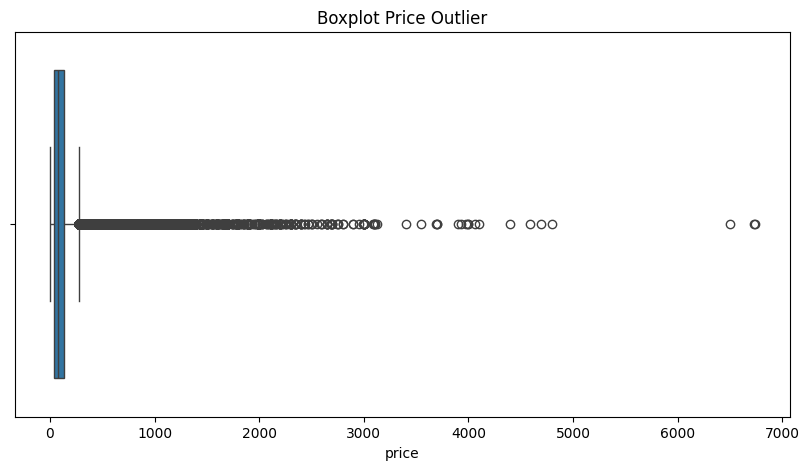

In [63]:
# Boxplot outlier price
plt.figure(figsize=(10,5))
sns.boxplot(x=order_items["price"])
plt.title("Boxplot Price Outlier")
plt.show()

In [64]:
#Handling outlier

#Tentukan Q1, Q2, dan IQR
Q1 = order_items["price"].quantile(0.25)
Q3 = order_items["price"].quantile(0.75)
IQR = Q3 - Q1

#Menentukan batas bawah dan batas atas
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

#Hapus kolom diluar range
order_items = order_items[(order_items["price"] >= lower_bound) & (order_items["price"] <= upper_bound)]

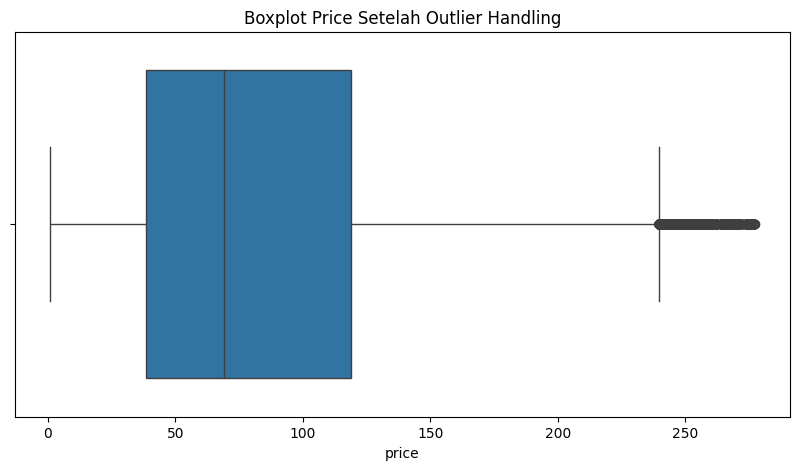

In [65]:
# Boxplot setelah handling outlier price
plt.figure(figsize=(10,5))
sns.boxplot(x=order_items["price"])
plt.title("Boxplot Price Setelah Outlier Handling")
plt.show()

In [66]:
#Periksa statistik price kembali
order_items["price"].describe()

,price
count,104223.000000
mean,83.974668
std,58.580002
min,0.850000
25%,38.500000
50%,69.000000
75%,118.990000
max,277.300000


In [67]:
#Periksa statistik freight_value
order_items["freight_value"].describe()

,freight_value
count,104223.000000
mean,18.558853
std,12.049322
min,0.000000
25%,12.790000
50%,16.010000
75%,19.840000
max,299.160000


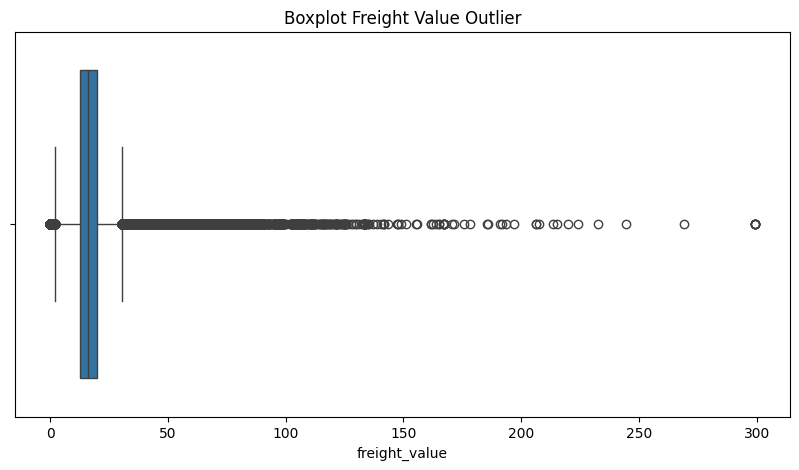

In [68]:
#Boxplot outlier freight_value
plt.figure(figsize=(10,5))
sns.boxplot(x=order_items["freight_value"])
plt.title("Boxplot Freight Value Outlier")
plt.show()

In [69]:
#Handling outlier freight_value

#Tentukan Q1, Q3, IQR
Q1 = order_items["freight_value"].quantile(0.25)
Q3 = order_items["freight_value"].quantile(0.75)
IQR = Q3 - Q1

#Tentukan batas atas dan batas bawah
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

#Hapus kolom diluar range
order_items = order_items[(order_items["freight_value"] >= lower_bound) & (order_items["freight_value"] <= upper_bound)]

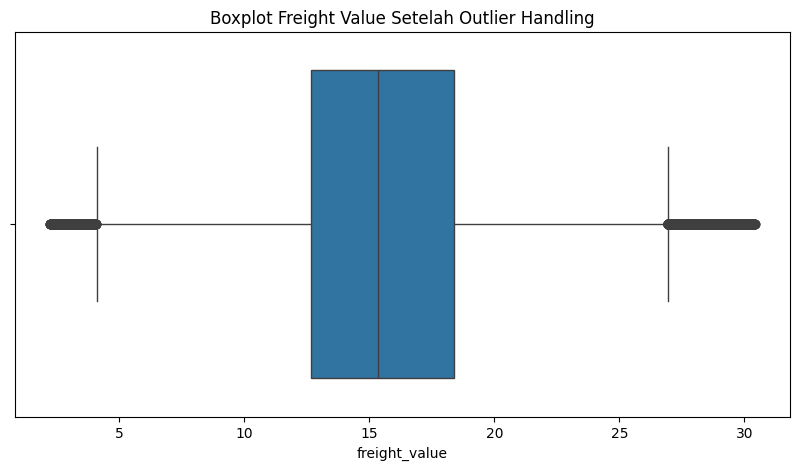

In [70]:
#Boxplot setelah outlier handling
plt.figure(figsize=(10,5))
sns.boxplot(x=order_items["freight_value"])
plt.title("Boxplot Freight Value Setelah Outlier Handling")
plt.show()

In [71]:
#Periksa kembali statistik
order_items["freight_value"].describe()

,freight_value
count,93975.000000
mean,15.751864
std,5.113773
min,2.240000
25%,12.660000
50%,15.350000
75%,18.370000
max,30.410000


**Ubah order_item_id menjadi qty untuk mengekstrak profil unit per baris pesanan**

In [72]:
#DataFrame order_items_df dikelompokkan berdasarkan product_id dan order_id.
#Semua item yang termasuk dalam pesanan yang sama untuk produk yang sama akan digabungkan.

order_items_consolidated = (
    order_items.groupby(by=["product_id", "order_id"])
    .agg(
        {
            "order_item_id": "count",
            "seller_id": "first",
            "shipping_limit_date": "first",
            "price": "first",
            "freight_value": "first",
        }
    )
    .reset_index()
)

order_items_consolidated

,product_id,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value
0,00066f42aeeb9f3007548bb9d3f33c38,f30149f4a8882a08895b6a242aa0d612,1,5670f4db5b62c43d542e1b2d56b0cf7c,2018-05-24 18:58:59,101.65,18.59
1,00088930e925c41fd95ebfe695fd2655,f5eda0ded77c1293b04c953138c8331d,1,7142540dd4c91e2237acb7e911c4eba2,2017-12-18 19:32:19,129.90,13.93
2,0009406fd7479715e4bef61dd91f2462,0bf736fd0fd5169d60de3699fcbcf986,1,4a3ca9315b744ce9f8e9374361493884,2017-12-29 16:12:36,229.00,13.10
3,000b8f95fcb9e0096488278317764d19,3aba44d8e554ab4bb8c09f6f78032ca8,1,40ec8ab6cdafbcc4f544da38c67da39a,2018-08-16 13:35:21,58.90,19.60
4,000b8f95fcb9e0096488278317764d19,6f0dfb5b5398b271cc6bbd9ee263530e,1,40ec8ab6cdafbcc4f544da38c67da39a,2018-08-07 22:15:19,58.90,19.60
...,...,...,...,...,...,...,...
85049,fffdb2d0ec8d6a61f0a0a0db3f25b441,2878b4e373a9556df9aa1708a4e5c3c8,1,9f505651f4a6abe901a56cdc21508025,2018-08-09 16:55:38,34.99,7.51
85050,fffdb2d0ec8d6a61f0a0a0db3f25b441,a8159270bc9cf7d54450e079ba6b7232,1,9f505651f4a6abe901a56cdc21508025,2018-04-09 05:35:27,29.99,18.23
85051,fffdb2d0ec8d6a61f0a0a0db3f25b441,beaf95465b542dea76df78b2fb86a97a,1,9f505651f4a6abe901a56cdc21508025,2018-04-25 10:30:35,34.99,18.23
85052,fffdb2d0ec8d6a61f0a0a0db3f25b441,d6c1ed12e8eeaa15e9d5c83c79598f85,1,9f505651f4a6abe901a56cdc21508025,2018-08-14 17:25:18,34.99,7.51


In [73]:
#Memeriksa adakah data yang hilang
print(f"Orders di tabel baru: {order_items_consolidated['order_id'].nunique()}")
print(f"Orders di tabel lama: {order_items['order_id'].nunique()}")
print(f"SKUs di di tabel baru: {order_items_consolidated['product_id'].nunique()}")
print(f"SKUs di tabel lama: {order_items['product_id'].nunique()}")
print(f"Total quantity di tabel baru: {order_items_consolidated['order_item_id'].sum()}")
print(f"Total quantity di tabel lama: {len(order_items['order_item_id'])}")

Orders di tabel baru: 82186
Orders di tabel lama: 82186
SKUs di di tabel baru: 27336
SKUs di tabel lama: 27336
Total quantity di tabel baru: 93975
Total quantity di tabel lama: 93975


tidak ada data yang hilang selama proses penggabungan

In [74]:
# Mengganti nama kolom order_item_id column menjadi qty
order_items_consolidated.rename(columns={"order_item_id": "qty"}, inplace=True)
order_items_consolidated.head()

,product_id,order_id,qty,seller_id,shipping_limit_date,price,freight_value
0,00066f42aeeb9f3007548bb9d3f33c38,f30149f4a8882a08895b6a242aa0d612,1,5670f4db5b62c43d542e1b2d56b0cf7c,2018-05-24 18:58:59,101.65,18.59
1,00088930e925c41fd95ebfe695fd2655,f5eda0ded77c1293b04c953138c8331d,1,7142540dd4c91e2237acb7e911c4eba2,2017-12-18 19:32:19,129.90,13.93
2,0009406fd7479715e4bef61dd91f2462,0bf736fd0fd5169d60de3699fcbcf986,1,4a3ca9315b744ce9f8e9374361493884,2017-12-29 16:12:36,229.00,13.10
3,000b8f95fcb9e0096488278317764d19,3aba44d8e554ab4bb8c09f6f78032ca8,1,40ec8ab6cdafbcc4f544da38c67da39a,2018-08-16 13:35:21,58.90,19.60
4,000b8f95fcb9e0096488278317764d19,6f0dfb5b5398b271cc6bbd9ee263530e,1,40ec8ab6cdafbcc4f544da38c67da39a,2018-08-07 22:15:19,58.90,19.60


####Cleaning Tabel Order Payments

**Handling Outliers**

In [75]:
# Periksa statistik sebelum menghandle outliers
order_payments["payment_value"].describe()

,payment_value
count,103886.000000
mean,154.100380
std,217.494064
min,0.000000
25%,56.790000
50%,100.000000
75%,171.837500
max,13664.080000


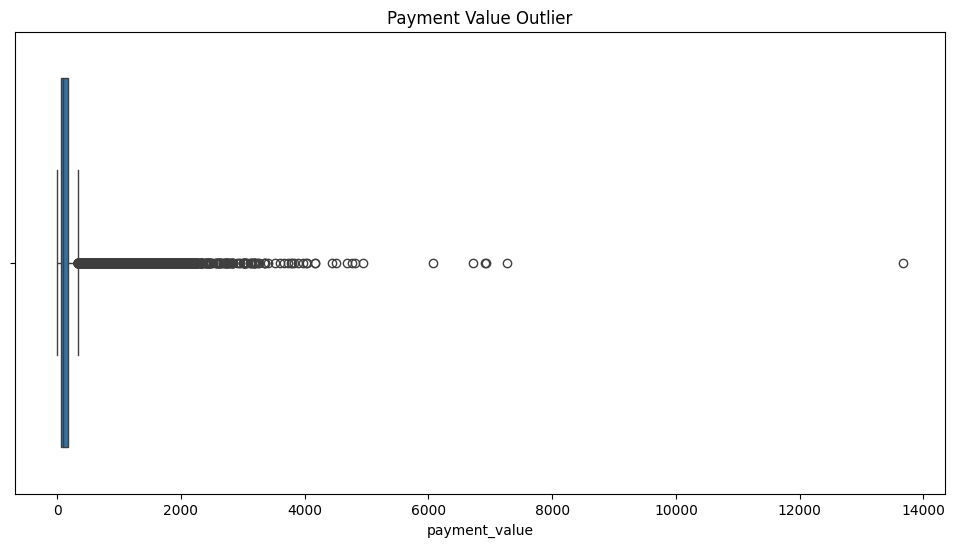

In [76]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=order_payments["payment_value"])
plt.title("Payment Value Outlier")
plt.show()

In [77]:
# Handling outliers dari payment_value

# Kalkulasi Q1, Q3 and IQR
Q1 = order_payments["payment_value"].quantile(0.25)
Q3 = order_payments["payment_value"].quantile(0.75)
IQR = Q3 - Q1

# Definisikan batas bawah dan batas atas
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Hapus baris dengan 'payment_value' di luar range
order_payments = order_payments[
    (order_payments["payment_value"] >= lower_bound)
    & (order_payments["payment_value"] <= upper_bound)
]

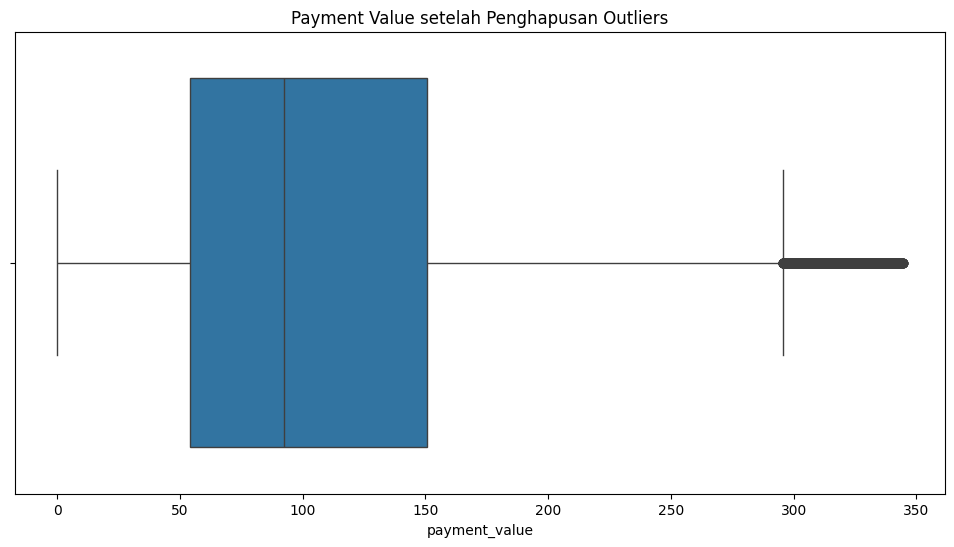

In [78]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=order_payments["payment_value"])
plt.title("Payment Value setelah Penghapusan Outliers")
plt.show()

In [79]:
#Periksa statistik kembali
order_payments["payment_value"].describe()

,payment_value
count,95905.000000
mean,110.062133
std,72.785054
min,0.000000
25%,54.000000
50%,92.200000
75%,150.580000
max,344.340000


####Cleaning Tabel Products

**Handling penamaan atribut**

In [80]:
#Mengubah salah ketik pada penamaan kolom
products.rename(columns={"product_name_lenght": "product_name_length"}, inplace=True)
products.rename(columns={"product_description_lenght": "product_description_length"}, inplace=True)
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_length         32341 non-null  float64
 3   product_description_length  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


**Handling missing values**

In [81]:
print(
    f"Frekuensi setiap nilai dalam atribut product_category_name:\n {products['product_category_name'].value_counts()}"
)

Frekuensi setiap nilai dalam atribut product_category_name:
 product_category_name
cama_mesa_banho                  3029
esporte_lazer                    2867
moveis_decoracao                 2657
beleza_saude                     2444
utilidades_domesticas            2335
                                 ... 
fashion_roupa_infanto_juvenil       5
casa_conforto_2                     5
pc_gamer                            3
seguros_e_servicos                  2
cds_dvds_musicais                   1
Name: count, Length: 73, dtype: int64


In [82]:
# Mengisi nilai kosong dengan modus kolom product_category_name
# Cari modus product_category_name
mode_pcn = products["product_category_name"].mode()[0]

# Isi missing values di product_category_name dengan modus
products["product_category_name"] = products["product_category_name"].fillna(mode_pcn)

<Axes: xlabel='product_name_length', ylabel='Count'>

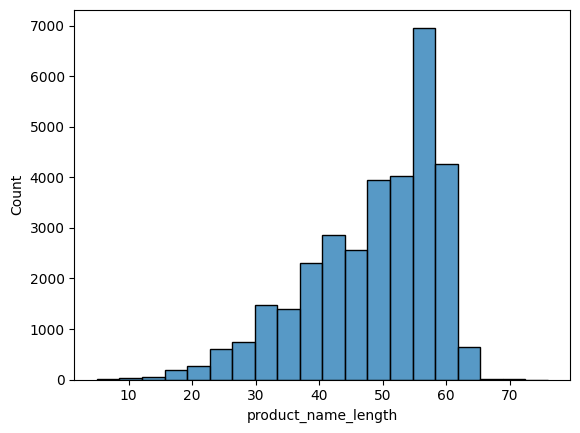

In [83]:
#Plot distribusi product_name_length
sns.histplot(data=products, x="product_name_length", bins=20)

<Axes: xlabel='product_description_length', ylabel='Count'>

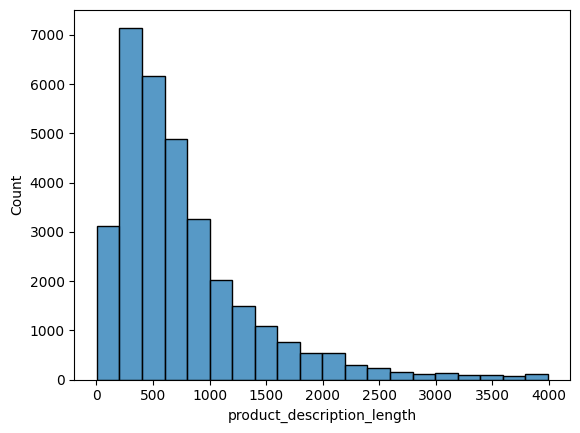

In [84]:
#Plot distribusi product_description_length
sns.histplot(data=products, x="product_description_length", bins=20)

<Axes: xlabel='product_photos_qty', ylabel='Count'>

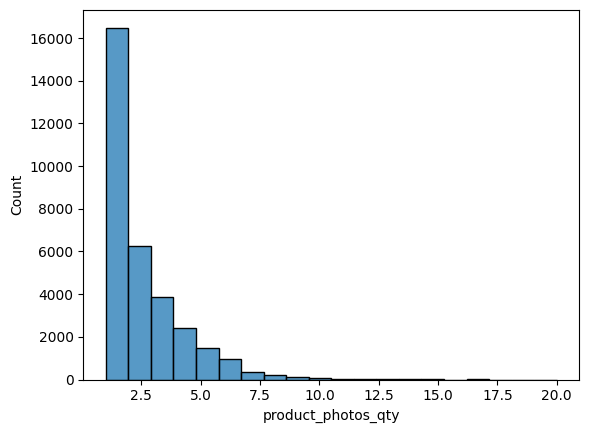

In [85]:
#Plot distribusi product_photos_qty
sns.histplot(data=products, x="product_photos_qty", bins=20)

<Axes: xlabel='product_weight_g', ylabel='Count'>

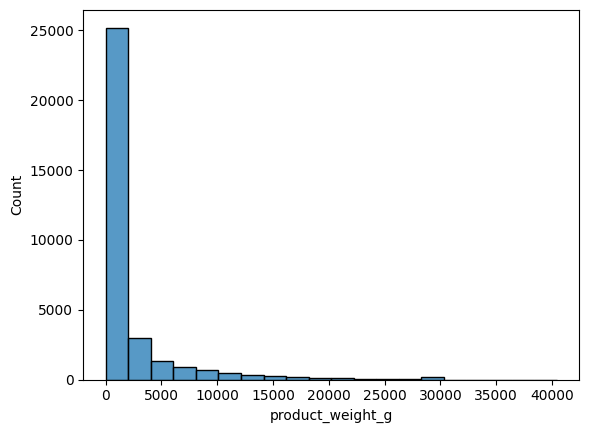

In [86]:
# Plot distribus of the product_weight_g
sns.histplot(data=products, x="product_weight_g", bins=20)

<Axes: xlabel='product_length_cm', ylabel='Count'>

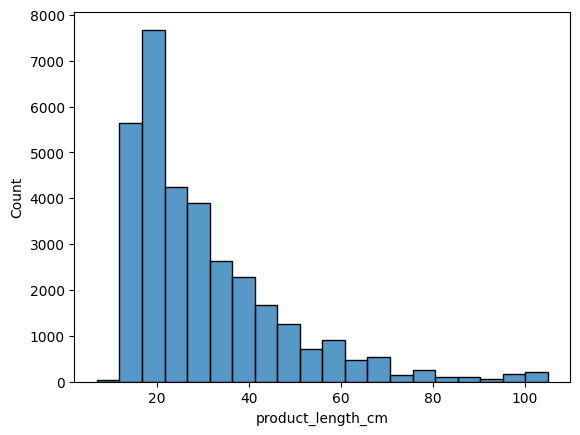

In [87]:
# Plot distribution product_length_cm
sns.histplot(data=products, x="product_length_cm", bins=20)

<Axes: xlabel='product_height_cm', ylabel='Count'>

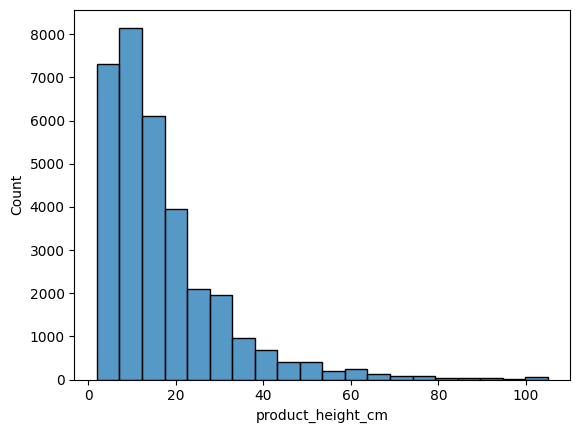

In [88]:
# Plot distribusi product_height_cm
sns.histplot(data=products, x="product_height_cm", bins=20)

<Axes: xlabel='product_width_cm', ylabel='Count'>

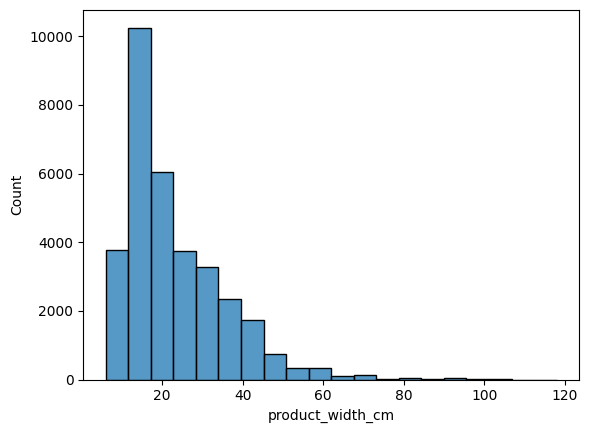

In [89]:
# Plot distribusi product_width_cm
sns.histplot(data=products, x="product_width_cm", bins=20)

In [90]:
median_name_length = products["product_name_length"].median()
median_desc_length = products["product_description_length"].median()
median_photos_qty = products["product_photos_qty"].median()
median_weight = products["product_weight_g"].median()
median_length = products["product_length_cm"].median()
median_height = products["product_height_cm"].median()
median_width = products["product_width_cm"].median()

#Mengisi missing values dengan nilai median yang ada

products["product_name_length"] = products["product_name_length"].fillna(median_name_length)
products["product_description_length"] = products["product_description_length"].fillna(median_desc_length)
products["product_photos_qty"] = products["product_photos_qty"].fillna(median_photos_qty)
products["product_weight_g"] = products["product_weight_g"].fillna(median_weight)
products["product_length_cm"] = products["product_length_cm"].fillna(median_length)
products["product_height_cm"] = products["product_height_cm"].fillna(median_height)
products["product_width_cm"] = products["product_width_cm"].fillna(median_width)

In [91]:
#Check Missing values data yang sudah dibersihkan
print(products.isnull().sum())

product_id                    0
product_category_name         0
product_name_length           0
product_description_length    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64


**Handling format tipe data**

In [92]:
# Ubah tipe data product_name_length attribute ke int
products["product_name_length"] = products["product_name_length"].astype(int)

# Ubah tipe data product_description_length attribute ke int
products["product_description_length"] = products["product_description_length"].astype(int)

# Ubah tipe data product_photos_qty attribute ke int
products["product_photos_qty"] = products["product_photos_qty"].astype(int)

# Ubah tipe data product_weight_g attribute ke int
products["product_weight_g"] = products["product_weight_g"].astype(int)

# Ubah tipe data product_length_cm attribute ke int
products["product_length_cm"] = products["product_length_cm"].astype(int)

# Ubah tipe data product_height_cm attribute ke int
products["product_height_cm"] = products["product_height_cm"].astype(int)

# Ubah tipe data product_width_cm attribute ke int
products["product_width_cm"] = products["product_width_cm"].astype(int)

In [93]:
products.head()

,product_id,product_category_name,product_name_length,product_description_length,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40,287,1,225,16,10,14
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44,276,1,1000,30,18,20
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46,250,1,154,18,9,15
3,cef67bcfe19066a932b7673e239eb23d,bebes,27,261,1,371,26,4,26
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37,402,4,625,20,17,13


####Cleaning Tabel Seller

**Handling tipe data format**



In [94]:
# Ubah seller_zip_code_prefix ke string
sellers["seller_zip_code_prefix"] = sellers["seller_zip_code_prefix"].astype(str)

# Check tipe data seller_zip_code_prefix
sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   object
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: object(4)
memory usage: 96.8+ KB


####Cleaning Tabel Customer

**Handling format tipe data**

In [95]:
# Ubah customer_zip_code_prefix attribute ke string
customers["customer_zip_code_prefix"] = customers["customer_zip_code_prefix"].astype(str)

# Check tipe data customer_zip_code_prefix
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  object
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: object(5)
memory usage: 3.8+ MB


####Cleaning Tabel Geolokasi

**Handling format tipe data**

In [96]:
# Ubah geolocation_zip_code_prefix ke string
geolocation["geolocation_zip_code_prefix"] = geolocation["geolocation_zip_code_prefix"].astype(str)

# Check tipe data geolocation_zip_code_prefix
geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  object 
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), object(3)
memory usage: 38.2+ MB


**Handling redundansi data**

In [97]:
# Hapus duplikasi data dari dataset
geolocation.drop_duplicates(subset=["geolocation_zip_code_prefix"], keep="first", inplace=True)

# Check apakah masih terdapat duplikasi
print(f"Total redundansi data: {geolocation.duplicated().sum()}")

Total redundansi data: 0


**Handling inkonsistensi data**

In [98]:
# Check data unique geolocation_city
print(f"Nama data unik:\n {geolocation['geolocation_city'].unique()}")

Nama data unik:
 ['sao paulo' 'são paulo' 'osasco' ... 'floriano peixoto' 'erebango'
 'santa cecilia do sul']


In [99]:
# Frekuensi kemunculan geolocation_city
geolocation.groupby(by=["geolocation_city", "geolocation_zip_code_prefix"]).agg({"geolocation_city": "count"})

,,geolocation_city
geolocation_city,geolocation_zip_code_prefix,
abadia de goias,75345,1
abadia dos dourados,38540,1
abadiania,72940,1
abaete,35620,1
abaetetuba,68440,1
...,...,...
águas lindas de goiás,72927,1
álvaro de carvalho,17410,1
ângulo,86755,1


In [100]:
geolocation.groupby(by=["geolocation_city", "geolocation_zip_code_prefix"]).agg({"geolocation_city": "nunique"})

,,geolocation_city
geolocation_city,geolocation_zip_code_prefix,
abadia de goias,75345,1
abadia dos dourados,38540,1
abadiania,72940,1
abaete,35620,1
abaetetuba,68440,1
...,...,...
águas lindas de goiás,72927,1
álvaro de carvalho,17410,1
ângulo,86755,1


In [101]:
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "abadiânia" if x == "abadiania" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "abaeté" if x == "abaete" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "abaré" if x == "abare" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "abatiá" if x == "abatia" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "são paulo" if x == "sao paulo" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "cidade gaúcha" if x == "cidade" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "arraial do cabo" if x == "...arraial do cabo" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "quarto centenário" if x == "4o. centenario" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "quarto centenário" if x == "4º centenario" else x
)
geolocation.geolocation_city = geolocation.geolocation_city.apply(
    lambda x: "quarto centenário" if x == "quarto centenario" else x
)

#Homogenasi Data
geolocation.geolocation_city.unique()

array(['são paulo', 'osasco', 'carapicuíba', ..., 'floriano peixoto',
       'erebango', 'santa cecilia do sul'], dtype=object)



> Seperti yang disampaikan sebelumnya ada beberapa dataset yang dapat digabungkan. Setelah membersihkan data, maka proses penting lainnya adalah menjadikan beberapa dataset menjadi satu dataset besar guna memudahkan proses analisis.



###Merging datasets

**Merging tabel orders dan order items**

In [102]:
sales_df = orders.merge(order_items_consolidated, on="order_id")

In [103]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85053 entries, 0 to 85052
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85053 non-null  object         
 1   customer_id                    85053 non-null  object         
 2   order_status                   85053 non-null  object         
 3   order_purchase_timestamp       85053 non-null  datetime64[ns] 
 4   order_approved_at              85041 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84273 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85053 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85053 non-null  datetime64[ns] 
 8   date_ordinal                   85053 non-null  int64          
 9   shipping_time                  85053 non-null  timedelta64[ns]
 10  shipping_duration              85053 non-null  timedelta64[ns]
 11  es

**Merging tabel produk dengan tabel order_with_items**

In [104]:
sales_df = sales_df.merge(products, on="product_id")
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85053 entries, 0 to 85052
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85053 non-null  object         
 1   customer_id                    85053 non-null  object         
 2   order_status                   85053 non-null  object         
 3   order_purchase_timestamp       85053 non-null  datetime64[ns] 
 4   order_approved_at              85041 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84273 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85053 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85053 non-null  datetime64[ns] 
 8   date_ordinal                   85053 non-null  int64          
 9   shipping_time                  85053 non-null  timedelta64[ns]
 10  shipping_duration              85053 non-null  timedelta64[ns]
 11  es

**Merging tabel sales dengan tabel product category**

In [105]:
sales_df = sales_df.merge(product_category_name_translation, on="product_category_name")
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85035 entries, 0 to 85034
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85035 non-null  object         
 1   customer_id                    85035 non-null  object         
 2   order_status                   85035 non-null  object         
 3   order_purchase_timestamp       85035 non-null  datetime64[ns] 
 4   order_approved_at              85023 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84257 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85035 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85035 non-null  datetime64[ns] 
 8   date_ordinal                   85035 non-null  int64          
 9   shipping_time                  85035 non-null  timedelta64[ns]
 10  shipping_duration              85035 non-null  timedelta64[ns]
 11  es

**Merge tabel sales dengan dataset order reviews**

In [106]:
sales_df = sales_df.merge(order_reviews, on="order_id", how="left")
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85579 entries, 0 to 85578
Data columns (total 33 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85579 non-null  object         
 1   customer_id                    85579 non-null  object         
 2   order_status                   85579 non-null  object         
 3   order_purchase_timestamp       85579 non-null  datetime64[ns] 
 4   order_approved_at              85567 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84794 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85579 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85579 non-null  datetime64[ns] 
 8   date_ordinal                   85579 non-null  int64          
 9   shipping_time                  85579 non-null  timedelta64[ns]
 10  shipping_duration              85579 non-null  timedelta64[ns]
 11  es

> Ada beberapa dataset yang tidak di merge guna dianalisa lebih lanjut pada tahap EDA.



## Exploratory Data Analysis (EDA)

###Analisa Order

In [107]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85579 entries, 0 to 85578
Data columns (total 33 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85579 non-null  object         
 1   customer_id                    85579 non-null  object         
 2   order_status                   85579 non-null  object         
 3   order_purchase_timestamp       85579 non-null  datetime64[ns] 
 4   order_approved_at              85567 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84794 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85579 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85579 non-null  datetime64[ns] 
 8   date_ordinal                   85579 non-null  int64          
 9   shipping_time                  85579 non-null  timedelta64[ns]
 10  shipping_duration              85579 non-null  timedelta64[ns]
 11  es

In [108]:
# Check order delivery yang belum terkirim
sales_df[sales_df["order_delivered_carrier_date"].isnull()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_ordinal,shipping_time,...,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1,71303d7e93b399f5bcd537d124c0bcfa,b106b360fe2ef8849fbbd056f777b4d5,canceled,2016-10-02,2016-10-06 15:50:56,NaT,2016-11-09,2016-10-25,736239,-15 days,...,18,18,18,baby,34d62feeefaf60ef6ff7204af19fe109,1.0,No comment,No comment,2016-10-27,2016-10-27 23:40:51
40,711b9be9c346d9ecdb9d38a5e1e7e39b,81e4aed5ab4253757305267b80712689,invoiced,2016-10-04,2016-10-04 14:08:38,NaT,2016-10-28,2016-11-24,736241,27 days,...,19,7,17,consoles_games,845e2bc6ae8e8a91c1c84cf2aaee9880,1.0,No comment,O controle está com problemas e fiz a devoluçã...,2016-11-26,2016-11-28 13:43:00
42,966f96af9d189dc428ff04ebbca821b8,90e1931af4fb878dbe45c79e6e458015,canceled,2016-10-04,2016-10-06 15:57:38,NaT,2016-10-31,2016-11-24,736241,24 days,...,31,5,25,toys,de9f64e09412ae0a405eeaf126e4dd0d,5.0,No comment,Produto excelente e prazo de entrega ótimo.\r\...,2016-11-26,2016-11-28 12:50:21
49,dd359d3c294458c6d642b2eea9212bf5,5c58d1ea5a893380ecdd96dd6dfd5ec5,invoiced,2016-10-04,2016-10-05 03:08:27,NaT,2016-10-20,2016-11-24,736241,35 days,...,28,18,14,computers_accessories,e1bc9e2f33c3fa1cb40845c285f0c02b,2.0,No comment,"Já comprei várias vezes no site ""lannister"";ma...",2016-11-27,2016-11-29 14:19:59
63,bfd31c6f76ff82a41e7beb05565aec4d,6c65055adfbc0007dbb4c5a22ea5ba8c,canceled,2016-10-04,2016-10-06 15:56:40,NaT,2016-11-03,2016-12-14,736241,41 days,...,18,16,16,telephony,6a91e35dd43fa13587108e698937cef8,1.0,No comment,Não sei quem foi a responsável pelo transtorno...,2016-12-16,2016-12-18 07:41:22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83221,d67b79fea59821fda4d363d337a56c3a,f2bea5055b5b15b6b57d07408a1c454a,canceled,2018-08-14,2018-08-14 11:44:14,NaT,2018-08-16,2018-08-20,736920,4 days,...,68,8,13,furniture_decor,271d0a476cdaa6f4b9be6d3523cdb05e,1.0,Vc paga e não entregam,"Empresa simplesmente não entregou o produto, n...",2018-08-22,2018-08-22 14:41:47
83539,00310b0c75bb13015ec4d82d341865a4,0dad07848c618cc5a4679a1bfe1db8d2,canceled,2018-08-15,2018-08-15 15:04:25,NaT,2018-08-17,2018-08-29,736921,12 days,...,16,12,11,housewares,8f28fc7d29a09403973697645d73b72a,1.0,No comment,No comment,2018-08-31,2018-08-31 22:49:14
83785,a9491b6c990bc3b79967c5f058e46d8f,ef1615358c72dae1c068aedc495a13f3,canceled,2018-08-16,2018-08-16 13:23:58,NaT,2018-08-23,2018-08-24,736922,1 days,...,30,12,16,health_beauty,956bcda0ce97fa46169b18083ec258e5,5.0,No comment,No comment,2018-08-26,2018-08-28 10:14:02
84068,acfa87544c19d596707d25cf2f7dab61,d5feeb223000c4c6dfdb7219b681e1d4,canceled,2018-08-17,2018-08-18 00:50:11,NaT,2018-08-27,2018-08-22,736923,-5 days,...,17,14,14,health_beauty,3dd6dd8bd30dd50a2b15328239cfcd91,1.0,nao entregou,nao entregou o pedido dentro do prazo ja solic...,2018-08-25,2018-08-27 03:32:14


In [109]:
# Check distribusi setiap nilai dalam atribut order_status
sales_df.groupby(by=("order_status")).size().reset_index(name="counts").sort_values(by="counts", ascending=False)

,order_status,counts
2,delivered,83818
5,shipped,913
1,canceled,360
3,invoiced,257
4,processing,224
6,unavailable,5
0,approved,2


<Axes: title={'center': 'Distribution dari Order Status'}, xlabel='Order Status', ylabel='Count'>

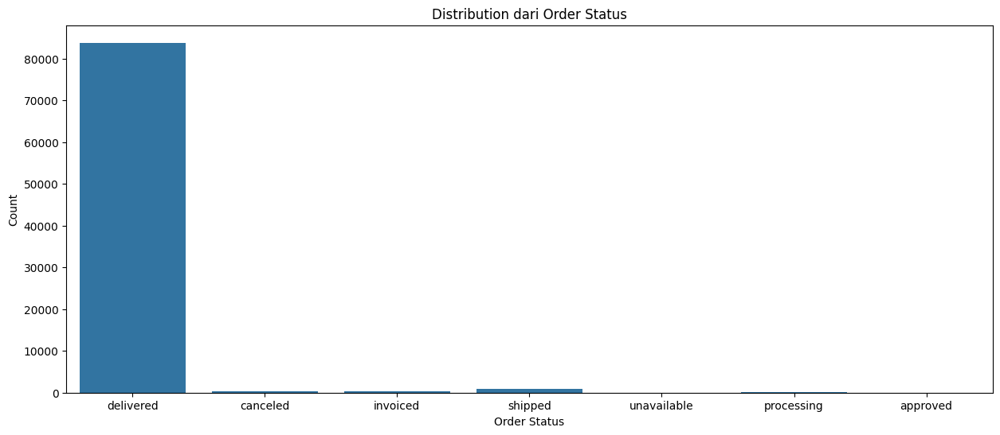

In [110]:
#Visualize distribusi dari order_status
plt.figure(figsize=(15, 6))
plt.title("Distribution dari Order Status")
plt.xlabel("Order Status")
plt.ylabel("Count")
sns.countplot(x="order_status", data=sales_df)

In [111]:
# Check berapa banyak order yang dikirim tepat waktu
sales_df["on_time"] = np.where(
    sales_df["order_delivered_customer_date"]
    <= sales_df["order_estimated_delivery_date"],
    1,
    0,
)
sales_df["on_time"].value_counts()

,count
on_time,
1,80073
0,5506


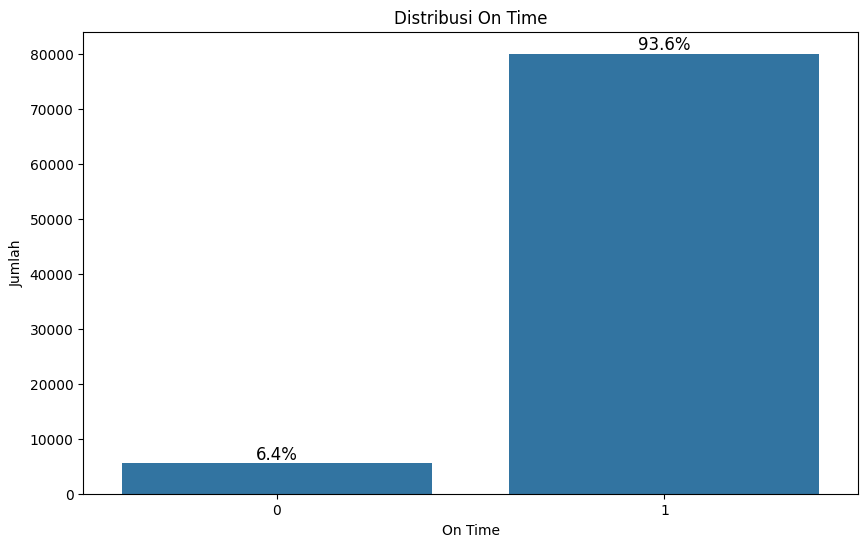

In [112]:
#Visualisasi on time
plt.figure(figsize=(10, 6))
sns.countplot(x="on_time", data=sales_df)
plt.title("Distribusi On Time")
plt.xlabel("On Time")
plt.ylabel("Jumlah")

# Hitung total on time
total_count = sales_df['on_time'].count()

# Menambahkan persentase
for p in plt.gca().patches:
    plt.annotate(f'{p.get_height() / total_count:.1%}',
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom',
                 fontsize=12)
plt.show()

###Analisa Produk

In [113]:
# Check kategori produk dengan harga termahal
sales_df.groupby("product_category_name_english").agg({"price": "sum"}).sort_values(
    by="price", ascending=False
)

,price
product_category_name_english,
bed_bath_table,912409.83
health_beauty,597000.46
sports_leisure,595412.37
watches_gifts,511201.69
computers_accessories,511195.06
...,...
home_comfort_2,682.87
cds_dvds_musicals,575.00
fashion_childrens_clothes,569.85


In [114]:
# Check kategori produk dengan harga termurah
sales_df.groupby("product_category_name_english").agg({"price": "sum"}).sort_values(
    by="price", ascending=True
)

,price
product_category_name_english,
computers,34.50
security_and_services,283.29
fashion_childrens_clothes,569.85
cds_dvds_musicals,575.00
home_comfort_2,682.87
...,...
computers_accessories,511195.06
watches_gifts,511201.69
sports_leisure,595412.37


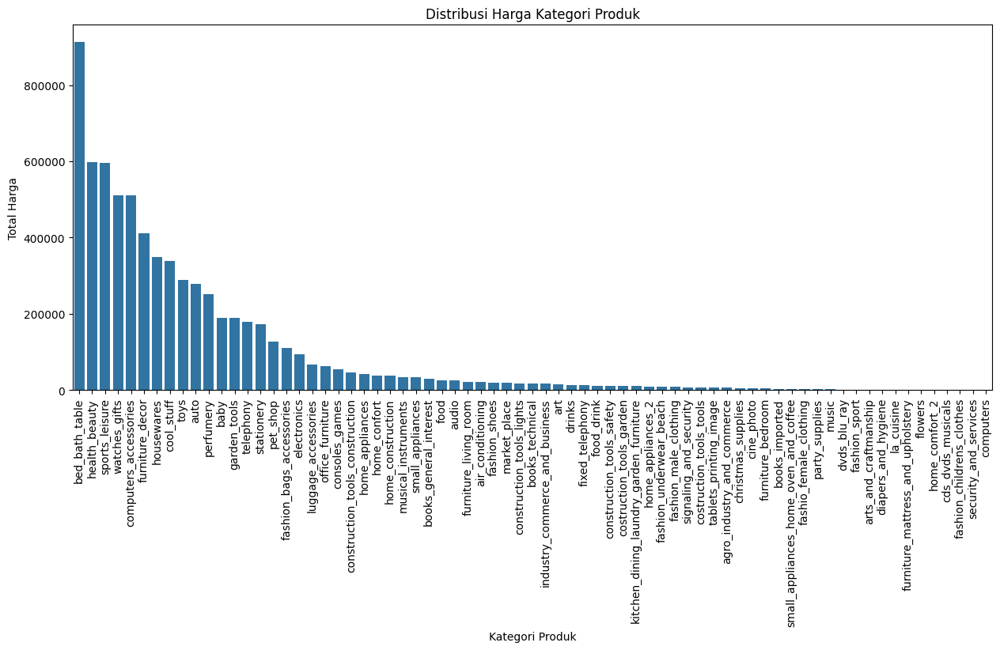

In [115]:
# Data
price_vis = (
    sales_df.groupby("product_category_name_english")
    .agg({"price": "sum"})
    .sort_values(by="price", ascending=False)
    .reset_index()
)

# Visualisasi data untuk harga produk
plt.figure(figsize=(15, 6))
plt.title("Distribusi Harga Kategori Produk")
plt.xlabel("Kategori Produk")
plt.xticks(rotation="vertical")
plt.ylabel("Total Harga")
sns.barplot(
    x="product_category_name_english",
    y="price",
    data=price_vis,
    errorbar=None
)

plt.show()

In [116]:
# Check kategori produk dengan nilai distribusi terbesar
sales_df.groupby("product_category_name_english").agg(
    {"freight_value": "sum"}
).sort_values(by="freight_value", ascending=False)

,freight_value
product_category_name_english,
bed_bath_table,173535.76
health_beauty,114499.83
sports_leisure,110531.14
furniture_decor,93047.83
computers_accessories,92822.06
...,...
cds_dvds_musicals,140.19
furniture_mattress_and_upholstery,130.20
fashion_childrens_clothes,95.51


In [117]:
# Check kategori produk dengan nilai distribusi terendah
sales_df.groupby("product_category_name_english").agg(
    {"freight_value": "sum"}
).sort_values(by="freight_value", ascending=True)

,freight_value
product_category_name_english,
computers,18.34
security_and_services,41.22
fashion_childrens_clothes,95.51
furniture_mattress_and_upholstery,130.20
cds_dvds_musicals,140.19
...,...
computers_accessories,92822.06
furniture_decor,93047.83
sports_leisure,110531.14


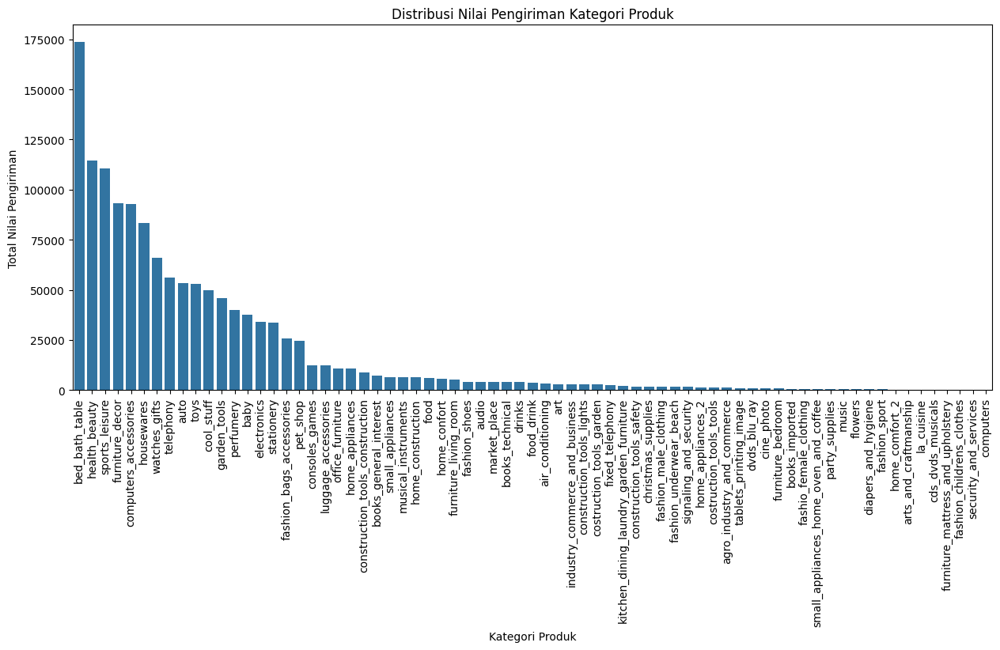

In [118]:
# Data
freight_value_vis = (
    sales_df.groupby("product_category_name_english")
    .agg({"freight_value": "sum"})
    .sort_values(by="freight_value", ascending=False)
    .reset_index()
)

# Visualisasi data untuk nilai distribusi produk
plt.figure(figsize=(15, 6))
plt.title("Distribusi Nilai Pengiriman Kategori Produk")
plt.xlabel("Kategori Produk")
plt.xticks(rotation="vertical")
plt.ylabel("Total Nilai Pengiriman")
sns.barplot(
    x="product_category_name_english",
    y="freight_value",
    data=freight_value_vis,
    errorbar=None
)

plt.show()

In [119]:
# Check kategori produk dengan jumlah penjualan tertinggi
sales_df.groupby("product_category_name_english").agg({"qty": "sum"}).sort_values(
    by="qty", ascending=False
)

,qty
product_category_name_english,
bed_bath_table,11810
health_beauty,8084
sports_leisure,7594
furniture_decor,7088
computers_accessories,6773
...,...
la_cuisine,10
fashion_childrens_clothes,8
furniture_mattress_and_upholstery,7


In [120]:
# Periksa kategori produk dengan jumlah penjualan terendah
sales_df.groupby("product_category_name_english").agg({"qty": "sum"}).sort_values(
    by="qty", ascending=True
)

,qty
product_category_name_english,
computers,1
security_and_services,2
furniture_mattress_and_upholstery,7
fashion_childrens_clothes,8
la_cuisine,10
...,...
computers_accessories,6773
furniture_decor,7088
sports_leisure,7594


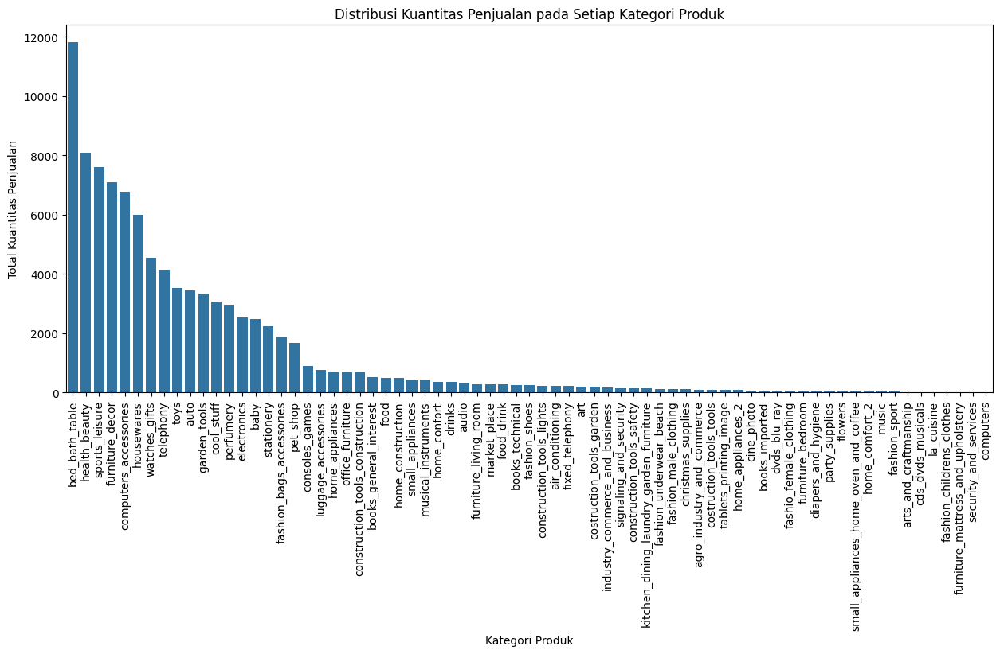

In [121]:
# Data
qty_vis = (
    sales_df.groupby("product_category_name_english")
    .agg({"qty": "sum"})
    .sort_values(by="qty", ascending=False)
    .reset_index()
)

# Visualisasi data untuk kuantitas penjualan produk
plt.figure(figsize=(15, 6))
plt.title("Distribusi Kuantitas Penjualan pada Setiap Kategori Produk")
plt.xlabel("Kategori Produk")
plt.xticks(rotation="vertical")
plt.ylabel("Total Kuantitas Penjualan")
sns.barplot(
    x="product_category_name_english",
    y="qty",
    data=qty_vis,
    errorbar=None
)

plt.show()

In [122]:
# Check kategori produk dengan pengiriman tercepat
sales_df.groupby("product_category_name_english").agg(
    {"shipping_duration": "sum"}
).sort_values(by="shipping_duration", ascending=True)

,shipping_duration
product_category_name_english,
bed_bath_table,-78118 days +00:25:26.290448384
computers,10 days 00:00:00
security_and_services,30 days 00:00:00
la_cuisine,69 days 00:00:00
fashion_childrens_clothes,74 days 00:00:00
...,...
housewares,54832 days 00:00:00
furniture_decor,70305 days 00:00:00
computers_accessories,75379 days 00:00:00


In [123]:
# Check kategori produk dengan pengiriman terlama
sales_df.groupby("product_category_name_english").agg(
    {"shipping_duration": "sum"}
).sort_values(by="shipping_duration", ascending=False)

,shipping_duration
product_category_name_english,
health_beauty,84155 days 00:00:00
sports_leisure,79822 days 00:00:00
computers_accessories,75379 days 00:00:00
furniture_decor,70305 days 00:00:00
housewares,54832 days 00:00:00
...,...
fashion_childrens_clothes,74 days 00:00:00
la_cuisine,69 days 00:00:00
security_and_services,30 days 00:00:00


###Analisa Pembayaran

In [124]:
# Check jenis pembayaran yang digunakan
order_payments.groupby(by=["payment_type"]).size().reset_index(
    name="counts"
).sort_values(ascending=False, by="counts")

,payment_type,counts
1,credit_card,70269
0,boleto,18504
4,voucher,5685
2,debit_card,1444
3,not_defined,3


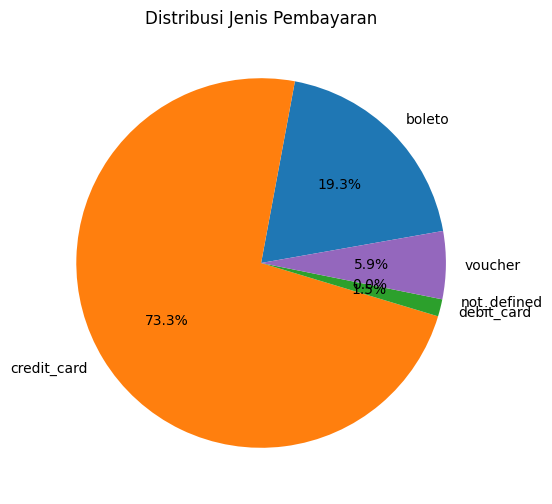

In [125]:
#Visualisasi jenis pembayaran yang digunakan
plt.figure(figsize=(15, 6))
plt.title("Distribusi Jenis Pembayaran")
plt.pie(
    order_payments.groupby(by=["payment_type"])
    .size()
    .reset_index(name="counts")["counts"],
    labels=order_payments.groupby(by=["payment_type"])
    .size()
    .reset_index(name="counts")["payment_type"],
    autopct="%1.1f%%",
    startangle=10,
)
plt.show()

###Analisa Customer

In [126]:
# Check distribusi pelanggan per kota
customers.groupby("customer_city").agg(
    {"customer_unique_id": "nunique"}
).sort_values(by="customer_unique_id", ascending=False)

,customer_unique_id
customer_city,
sao paulo,14984
rio de janeiro,6620
belo horizonte,2672
brasilia,2069
curitiba,1465
...,...
ibertioga,1
ibiajara,1
ibiara,1


In [127]:
# Check distribusi pelanggan per state
customers.groupby("customer_state").agg(
    {"customer_unique_id": "nunique"}
).sort_values(by="customer_unique_id", ascending=False)

,customer_unique_id
customer_state,
SP,40302
RJ,12384
MG,11259
RS,5277
PR,4882
SC,3534
BA,3277
DF,2075
ES,1964


<Axes: title={'center': 'Jumlah Pelanggan per State'}, xlabel='State', ylabel='Jumlah Pelanggan'>

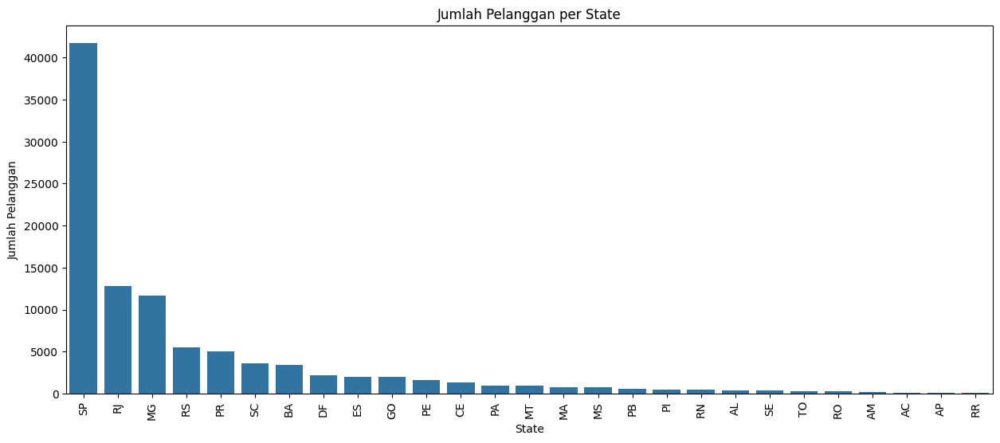

In [128]:
#Data
customers_per_state = customers["customer_state"].value_counts().reset_index()
customers_per_state.columns = ["customer_state", "count"]
customers_per_state = customers_per_state.sort_values(by="count", ascending=False)

# Visualisasi jumlah pelanggan per state
plt.figure(figsize=(15, 6))
plt.title("Jumlah Pelanggan per State")
plt.xlabel("State")
plt.xticks(rotation="vertical")
plt.ylabel("Jumlah Pelanggan")
sns.barplot(x="customer_state", y="count", data=customers_per_state.reset_index())

###Analisa Review

In [129]:
# Cek distribusi skor rating kategori produk yang diberikan oleh pelanggan
sales_df.groupby("product_category_name_english").agg(
    {"review_score": "mean"}
).sort_values(by="review_score", ascending=False)

,review_score
product_category_name_english,
cds_dvds_musicals,4.636364
fashion_childrens_clothes,4.500000
furniture_bedroom,4.500000
books_general_interest,4.449485
food_drink,4.424779
...,...
fashio_female_clothing,3.714286
fashion_male_clothing,3.637931
office_furniture,3.608350


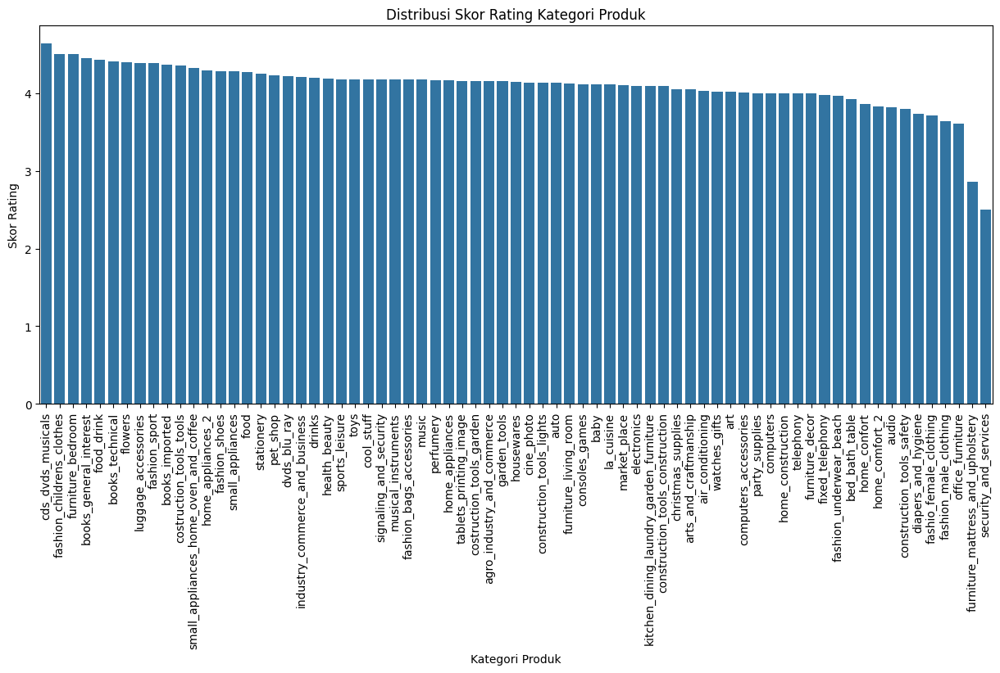

In [130]:
# Data
product_score = (
    sales_df.groupby("product_category_name_english")["review_score"]
    .mean()
    .reset_index()
)
product_score = product_score.sort_values(by="review_score", ascending=False)

# Visualisasikan distribusi skor rating kategori produk yang diberikan oleh pelanggan
plt.figure(figsize=(15, 6))
plt.title("Distribusi Skor Rating Kategori Produk")
plt.xlabel("Kategori Produk")
plt.xticks(rotation="vertical")
plt.ylabel("Skor Rating")
sns.barplot(
    x="product_category_name_english",
    y="review_score",
    data=product_score,
    errorbar=None,
)
plt.show()

###Analisa Sellers

**Merge tabel sales dengan dataset sellers**

In [131]:
sales_seller_df = sales_df.merge(sellers, on="seller_id")
sales_seller_df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_ordinal,shipping_time,...,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,on_time,seller_zip_code_prefix,seller_city,seller_state
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09,2016-10-04,736222,-36 days,...,6916ca4502d6d3bfd39818759d55d536,1.0,No comment,nao recebi o produto e nem resposta da empresa,2016-10-06,2016-10-07 18:32:28,0,81810,curitiba,PR
1,71303d7e93b399f5bcd537d124c0bcfa,b106b360fe2ef8849fbbd056f777b4d5,canceled,2016-10-02,2016-10-06 15:50:56,NaT,2016-11-09,2016-10-25,736239,-15 days,...,34d62feeefaf60ef6ff7204af19fe109,1.0,No comment,No comment,2016-10-27,2016-10-27 23:40:51,0,5503,sao paulo,SP
2,cd3b8574c82b42fc8129f6d502690c3e,7812fcebfc5e8065d31e1bb5f0017dae,delivered,2016-10-03,2016-10-04 10:19:23,2016-10-08 10:34:01,2016-10-14,2016-11-23,736240,40 days,...,212e6ab2b4801ca707b950aa0207ff8a,5.0,No comment,No comment,2016-10-19,2016-10-22 00:23:57,1,13481,limeira,SP
3,be5bc2f0da14d8071e2d45451ad119d9,7ec40b22510fdbea1b08921dd39e63d8,delivered,2016-10-03,2016-10-06 16:03:44,2016-10-21 16:33:46,2016-10-27,2016-11-07,736240,11 days,...,dc62f1e20d7f280e54066b6a92841086,4.0,No comment,Tudo certo...,2016-10-28,2016-10-29 11:29:53,1,15802,catanduva,SP
4,65d1e226dfaeb8cdc42f665422522d14,70fc57eeae292675927697fe03ad3ff5,canceled,2016-10-03,2016-10-04 10:18:57,2016-10-25 12:14:28,2016-11-08,2016-11-25,736240,17 days,...,f9fe37d91c506b29a0b4d9107f667bde,1.0,No comment,"O produto foi comprado em 10/10/2016, não cheg...",2016-11-09,2016-11-09 21:04:42,1,5571,sao paulo,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85574,d03ca98f59480e7e76c71fa83ecd8fb6,56b1ac2855cc6d7950b4ffa6a9b41b0d,delivered,2018-08-29,2018-08-29 11:24:02,2018-08-29 17:46:00,2018-08-30,2018-09-04,736935,5 days,...,5c7d6b979aed548db0901cf9ffe3a2dc,5.0,No comment,No comment,2018-08-31,2018-09-03 13:58:54,1,7152,guarulhos,SP
85575,52018484704db3661b98ce838612b507,e450a297a7bc6839ceb0cf1a2377fa02,delivered,2018-08-29,2018-08-29 12:35:17,2018-08-29 13:38:00,2018-08-30,2018-09-03,736935,4 days,...,7a11bf826668febba0800ec35884958c,1.0,Muito frágil !!!,"Achei o produto muito pequeno e onde fica a ""t...",2018-08-31,2018-09-21 13:54:38,1,5125,sao paulo,SP
85576,fb393211459aac00af932cd7ab4fa2cc,54365416b7ef5599f54a6c7821d5d290,delivered,2018-08-29,2018-08-29 09:25:12,2018-08-29 15:48:00,2018-08-30,2018-09-04,736935,5 days,...,a6b04aa8f3c756a9b4a31e59928b47fe,1.0,Não gostei,"Comprei um relógio, e quando chegou, me depare...",2018-08-31,2018-09-03 10:20:19,1,5849,sao paulo,SP
85577,d70442bc5e3cb7438da497cc6a210f80,10a79ef2783cae3d8d678e85fde235ac,delivered,2018-08-29,2018-08-29 10:35:16,2018-08-29 19:57:00,2018-08-30,2018-09-04,736935,5 days,...,925be27f368ac6590196ef6889ec90c6,5.0,Recomendo,"Entrega rápida, até mesmo antes do prazo estip...",2018-08-31,2018-09-02 23:04:33,1,4461,sao paulo,SP


In [132]:
# Periksa penjual dengan kinerja penjualan tertinggi
sales_seller_df.groupby("seller_id").agg({"price": "sum"}).sort_values(
    by="price", ascending=False
)

,price
seller_id,
4a3ca9315b744ce9f8e9374361493884,166435.77
4869f7a5dfa277a7dca6462dcf3b52b2,151790.86
7a67c85e85bb2ce8582c35f2203ad736,134750.00
da8622b14eb17ae2831f4ac5b9dab84a,134527.18
6560211a19b47992c3666cc44a7e94c0,116082.82
...,...
34aefe746cd81b7f3b23253ea28bef39,8.00
702835e4b785b67a084280efca355756,7.60
1fa2d3def6adfa70e58c276bb64fe5bb,6.90


In [133]:
# Periksa state penjual dengan kinerja penjualan tertinggi
sales_seller_df.groupby("seller_state").agg({"price": "sum"}).sort_values(
    by="price", ascending=False
)

,price
seller_state,
SP,4900272.95
PR,549975.08
MG,514799.37
RJ,338745.70
SC,238791.61
RS,142036.04
DF,56863.13
BA,41960.59
PE,40063.02


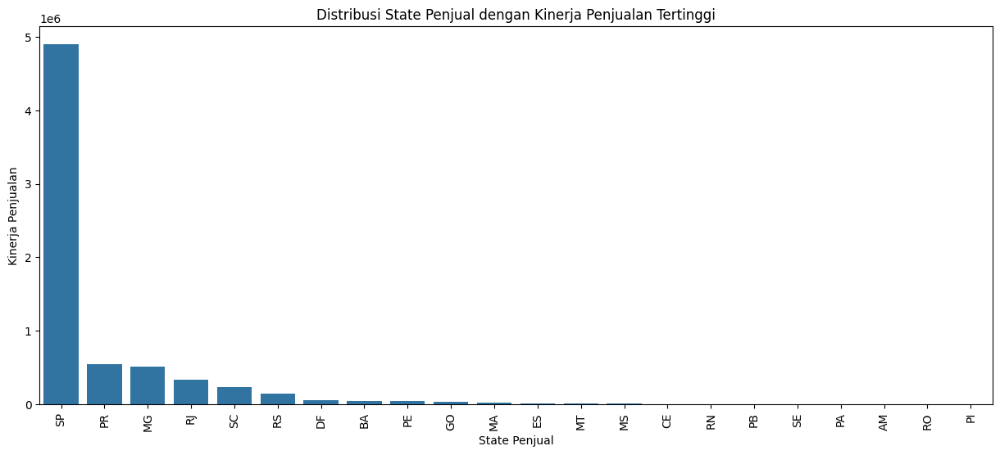

In [134]:
# Data
seller_state = (
    sales_seller_df.groupby("seller_state")["price"]
    .sum()
    .reset_index()
    .sort_values(ascending=False, by="price")
)

# Visualisasikan distribusi state penjual dengan kinerja penjualan tertinggi
plt.figure(figsize=(15, 6))
plt.title("Distribusi State Penjual dengan Kinerja Penjualan Tertinggi")
plt.xlabel("State Penjual")
plt.xticks(rotation="vertical")
plt.ylabel("Kinerja Penjualan")
sns.barplot(
    x="seller_state",
    y="price",
    data=seller_state,
    errorbar=None,
)
plt.show()

### Merge semua dataset

In [135]:
all_df = sales_seller_df.merge(customers, on="customer_id", how="left")
all_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85579 entries, 0 to 85578
Data columns (total 41 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85579 non-null  object         
 1   customer_id                    85579 non-null  object         
 2   order_status                   85579 non-null  object         
 3   order_purchase_timestamp       85579 non-null  datetime64[ns] 
 4   order_approved_at              85567 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84794 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85579 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85579 non-null  datetime64[ns] 
 8   date_ordinal                   85579 non-null  int64          
 9   shipping_time                  85579 non-null  timedelta64[ns]
 10  shipping_duration              85579 non-null  timedelta64[ns]
 11  es

In [136]:
# Tambahkan kolom total price pada tabel baru
all_df["total_price"] = all_df["qty"] * all_df["price"]
all_df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_ordinal,shipping_time,...,review_answer_timestamp,on_time,seller_zip_code_prefix,seller_city,seller_state,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,total_price
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09,2016-10-04,736222,-36 days,...,2016-10-07 18:32:28,0,81810,curitiba,PR,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,134.97
1,71303d7e93b399f5bcd537d124c0bcfa,b106b360fe2ef8849fbbd056f777b4d5,canceled,2016-10-02,2016-10-06 15:50:56,NaT,2016-11-09,2016-10-25,736239,-15 days,...,2016-10-27 23:40:51,0,5503,sao paulo,SP,0eb1ee9dba87f5b36b4613a65074337c,2975,sao paulo,SP,100.00
2,cd3b8574c82b42fc8129f6d502690c3e,7812fcebfc5e8065d31e1bb5f0017dae,delivered,2016-10-03,2016-10-04 10:19:23,2016-10-08 10:34:01,2016-10-14,2016-11-23,736240,40 days,...,2016-10-22 00:23:57,1,13481,limeira,SP,87776adb449c551e74c13fc34f036105,12030,taubate,SP,29.99
3,be5bc2f0da14d8071e2d45451ad119d9,7ec40b22510fdbea1b08921dd39e63d8,delivered,2016-10-03,2016-10-06 16:03:44,2016-10-21 16:33:46,2016-10-27,2016-11-07,736240,11 days,...,2016-10-29 11:29:53,1,15802,catanduva,SP,2f64e403852e6893ae37485d5fcacdaf,98280,panambi,RS,21.90
4,65d1e226dfaeb8cdc42f665422522d14,70fc57eeae292675927697fe03ad3ff5,canceled,2016-10-03,2016-10-04 10:18:57,2016-10-25 12:14:28,2016-11-08,2016-11-25,736240,17 days,...,2016-11-09 21:04:42,1,5571,sao paulo,SP,b8b8726af116a5cfb35b0315ecef9172,22770,rio de janeiro,RJ,21.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85574,d03ca98f59480e7e76c71fa83ecd8fb6,56b1ac2855cc6d7950b4ffa6a9b41b0d,delivered,2018-08-29,2018-08-29 11:24:02,2018-08-29 17:46:00,2018-08-30,2018-09-04,736935,5 days,...,2018-09-03 13:58:54,1,7152,guarulhos,SP,0421e7a23f21e5d54efed456aedbc513,13322,salto,SP,109.90
85575,52018484704db3661b98ce838612b507,e450a297a7bc6839ceb0cf1a2377fa02,delivered,2018-08-29,2018-08-29 12:35:17,2018-08-29 13:38:00,2018-08-30,2018-09-03,736935,4 days,...,2018-09-21 13:54:38,1,5125,sao paulo,SP,7a22d14aa3c3599238509ddca4b93b01,5863,sao paulo,SP,63.90
85576,fb393211459aac00af932cd7ab4fa2cc,54365416b7ef5599f54a6c7821d5d290,delivered,2018-08-29,2018-08-29 09:25:12,2018-08-29 15:48:00,2018-08-30,2018-09-04,736935,5 days,...,2018-09-03 10:20:19,1,5849,sao paulo,SP,b4dcade04bc548b7e3b0243c801f8c26,13184,hortolandia,SP,99.00
85577,d70442bc5e3cb7438da497cc6a210f80,10a79ef2783cae3d8d678e85fde235ac,delivered,2018-08-29,2018-08-29 10:35:16,2018-08-29 19:57:00,2018-08-30,2018-09-04,736935,5 days,...,2018-09-02 23:04:33,1,4461,sao paulo,SP,21dbe8eabd00b34492a939c540e2b1a7,2413,sao paulo,SP,6.90


In [137]:
all_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85579 entries, 0 to 85578
Data columns (total 42 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85579 non-null  object         
 1   customer_id                    85579 non-null  object         
 2   order_status                   85579 non-null  object         
 3   order_purchase_timestamp       85579 non-null  datetime64[ns] 
 4   order_approved_at              85567 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84794 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85579 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85579 non-null  datetime64[ns] 
 8   date_ordinal                   85579 non-null  int64          
 9   shipping_time                  85579 non-null  timedelta64[ns]
 10  shipping_duration              85579 non-null  timedelta64[ns]
 11  es

## Visualization & Explanatory Analysis

### Pertanyaan 1: Bagaimana tren penjualan e-commerce berdasarkan waktu?

Untuk menjawab pertanyaan di atas saya menggunakan rumus grow rate sebagai berikut:



> Growth Rate = ((Present value - Past value) / Past value) * 100



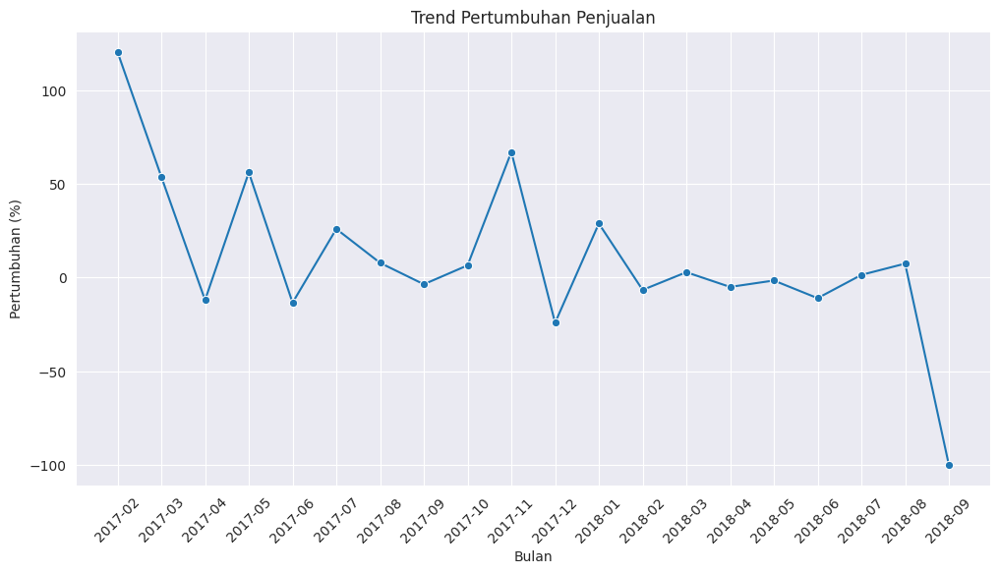

In [138]:
# Duplikat data agar tidak terjadi kesalahan proses
data = all_df

# Buat kolom Tahun-Bulan
data['year_month'] = data['order_purchase_timestamp'].dt.to_period('M')

# Filter data untuk mengecualikan tahun 2016
data = data[data['order_purchase_timestamp'].dt.year >= 2017]

# Agregasi jumlah pesanan dan total pendapatan per bulan
monthly_sales = data.groupby('year_month').agg({'order_id': 'count', 'total_price': 'sum'}).reset_index()

# Hitung Growth Rate
monthly_sales['growth_rate'] = monthly_sales['order_id'].pct_change() * 100
monthly_sales.dropna(inplace=True)
monthly_sales['year_month'] = monthly_sales['year_month'].astype(str)

# Visualisasi
sns.set_style("darkgrid")
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sales, x='year_month', y='growth_rate', marker='o', linestyle='-')
plt.xticks(rotation=45)
plt.ylabel('Pertumbuhan (%)')
plt.xlabel('Bulan')
plt.title('Trend Pertumbuhan Penjualan')
plt.show()

Dari grafik pertumbuhan penjualan cukup berubah-ubah, tapi jika dilihat lebih detail terdapat pola dari bulan Januari 2018 hingga Agustus 2018 pertumbuhan penjualan mulai mengalami stagnasi. Tentunya stagnansi ini akan berdampak pada penurunan yang secara nyata ditunjukkan pada September 2018.


Data tidak mengambil data tahun 2016 di karenakan akhir 2016 ke 2017 pertumbuhan penjualan mengalami kenaikkan hingga 100%. Hal ini dimungkinkan karena bisnis baru mulai berjalan stabil di awal tahun 2017.

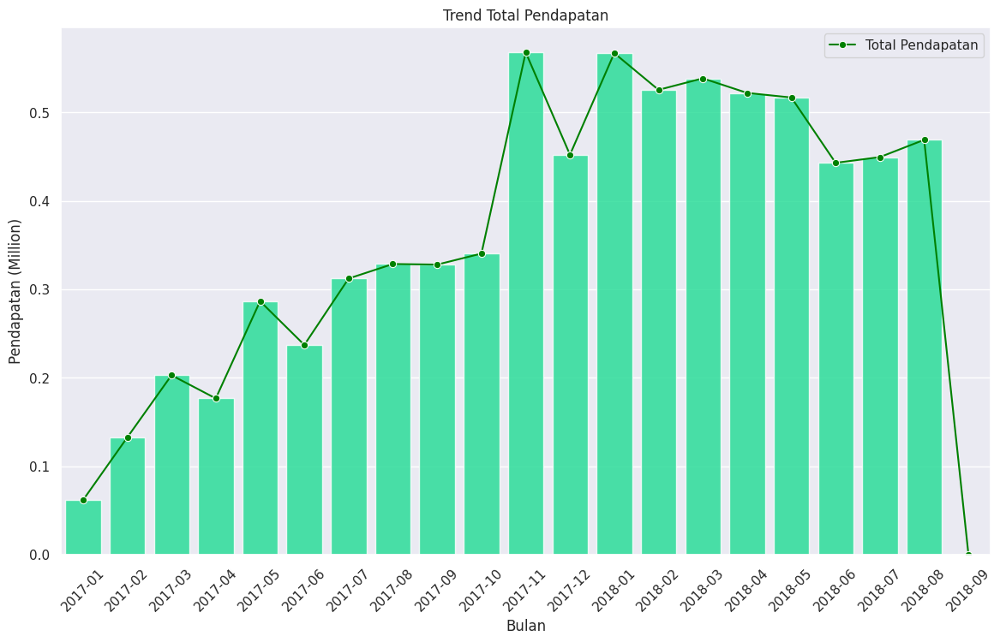

In [139]:
# Menggunakan data sebelumnya
revenue_per_month = data.groupby('year_month')['total_price'].sum().reset_index()
revenue_per_month['total_price'] = revenue_per_month['total_price'] / 1_000_000
revenue_per_month['year_month'] = revenue_per_month['year_month'].astype(str)

# Visualisasi
sns.set(rc={'figure.figsize':(14,8)})
sns.lineplot(data=revenue_per_month, x='year_month', y='total_price', marker='o', color='green', label='Total Pendapatan')
sns.barplot(data=revenue_per_month, x='year_month', y='total_price', alpha=0.8, color='mediumspringgreen', dodge=False)
plt.title('Trend Total Pendapatan')
plt.xlabel('Bulan')
plt.xticks(rotation=45)
plt.ylabel('Pendapatan (Million)')
plt.legend()
plt.show()

Selanjutnya adalah grafik total pendapatan. Grafik di atas memiliki trend kenaikan yang cukup sehat, namun 3 bulan terakhir terlihat tidak adanya kenaikan. Grafik di atas mendukung trend penjualan agar tidak bias.

### Pertanyaan 2: Produk kategori apa yang paling laris dan memberikan pendapatan tertinggi?

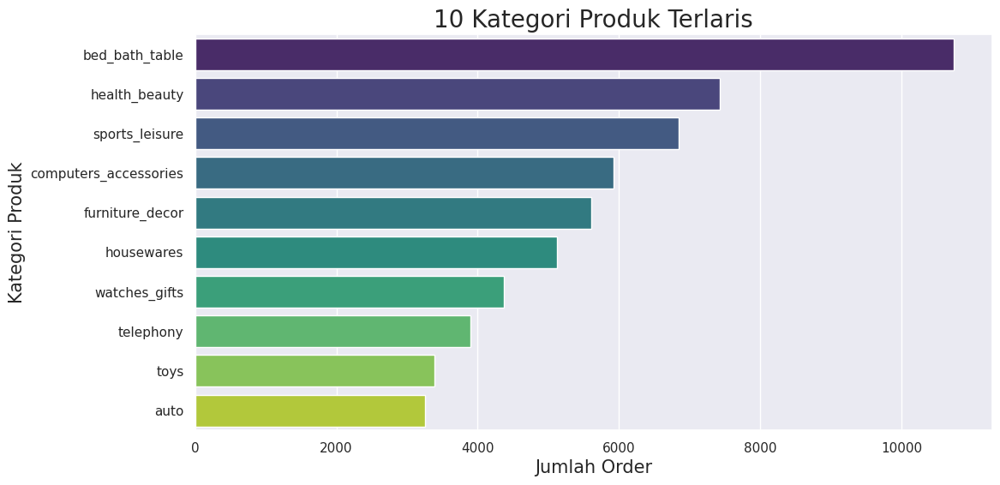

In [140]:
# Agregasi data kategori produk
top_products = data.groupby('product_category_name_english').agg({'order_id': 'count', 'total_price': 'sum'}).reset_index()

# Urutkan kategori berdasarkan jumlah order
top_products = top_products.sort_values(by='order_id', ascending=False).head(10)

# Visualisasi
fig, ax = plt.subplots(figsize=(12, 6))
sns.barplot(data=top_products, y='product_category_name_english', x='order_id', palette='viridis', hue='product_category_name_english', legend=False)

plt.xlabel('Jumlah Order',fontsize=15)
plt.ylabel('Kategori Produk',fontsize=15)
plt.title('10 Kategori Produk Terlaris',fontsize=20)
plt.show()

Dari grafik diatas dapat dilihat bahwa 10 kategori produk terlaris yang diperjual belikan adalah kebutuhan rumah tangga, kesehatan dan kecantikkan, peralatan olahraga, aksesoris komputer, dekorasi funiture, peralatan rumah tangga, jam tangan, telephone, mainan, dan automotif

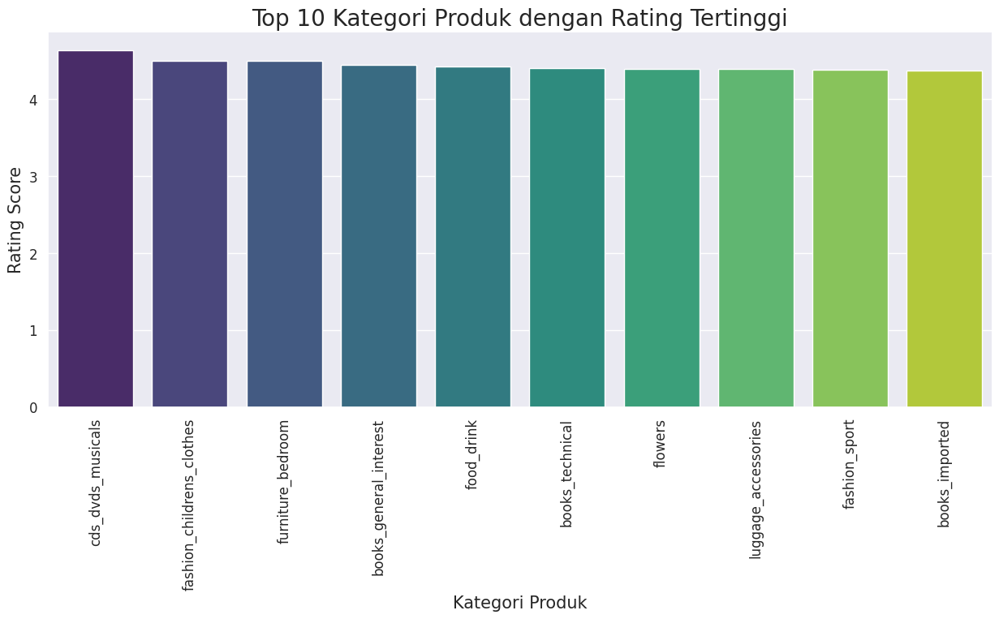

In [141]:
top_10_categories = (data.groupby("product_category_name_english")["review_score"]
    .mean()
    .nlargest(10)
)

# Visualisasi
plt.figure(figsize=(15, 6))
plt.title("Top 10 Kategori Produk dengan Rating Tertinggi",fontsize=20)
plt.xlabel("Kategori Produk", fontsize=15)
plt.xticks(rotation="vertical")
plt.ylabel("Rating Score", fontsize=15)
sns.barplot(
    x=top_10_categories.index,
    y=top_10_categories.values,
    palette='viridis',
    hue=top_10_categories.index,
    legend=False,
)
sns.despine()
plt.tick_params(labelsize=12)

plt.show()

Dari grafik di atas produk-produk yang ada diurutkan berdasarkan rating dari kategori produk. Grafik mendapati produk-produk yang berbeda dari grafik sebelumnya. Adapun kategori produk yang memiliki rating tinggi yaitu DVD dan CD musik, baju anak-anak, funiture kamar, buku, makanan dan minuman, buku teknikal, bunga, aksesoris tas, baju olahraga, buku import.

##Pertanyaan 3: Bagaimana performa pengiriman? Apakah ada keterlambatan yang signifikan?

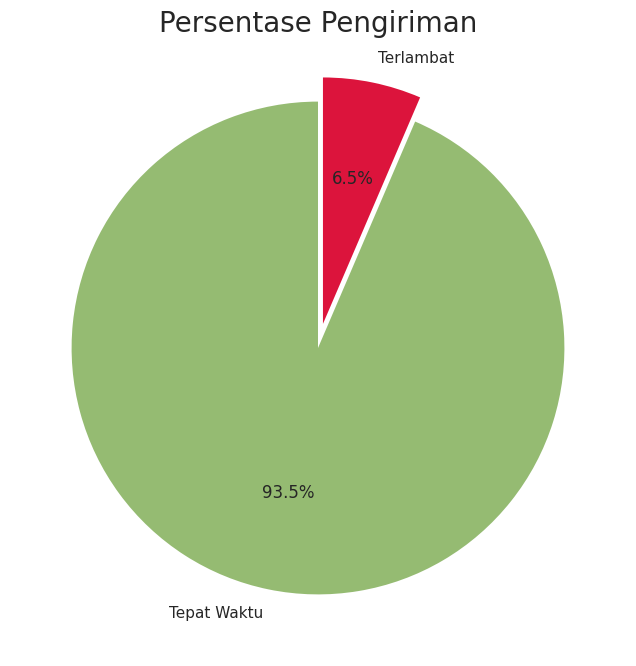

In [142]:
# Hitung jumlah pesanan yang tepat waktu dan terlambat
on_time_counts = data['on_time'].value_counts()

#Label
labels = ['Tepat Waktu', 'Terlambat']
colors = ['#95BB72', '#DC143C']
explode = (0, 0.1)

# Buat pie chart
plt.figure(figsize=(8, 8))
plt.pie(on_time_counts, labels=labels, autopct='%1.1f%%', colors=colors,
        startangle=90, wedgeprops={'edgecolor': 'none'}, explode=explode)
plt.title('Persentase Pengiriman', fontsize=20)
plt.show()

Dari grafik didapati bahwa persentase pengiriman yang tepat waktu sudah cukup baik yakni 93.5% dan keterlambatan sebesar 6.5%

##Pertanyaan 4: Siapa pelanggan terbaik berdasarkan analisis RFM (Recency, Frequency, Monetary)?

In [143]:
#Buat Analisa RFM untuk menjawab pertanyaan
# Hitung total_price dengan menggunakan .loc untuk menghindari SettingWithCopyWarning
data.loc[:, "total_price"] = data["price"] * data["qty"]

# Buat DataFrame RFM
rfm_df = data.groupby("customer_unique_id", as_index=False).agg(
    {"order_purchase_timestamp": "max", "order_id": "nunique", "total_price": "sum"}
)

# Ubah nama kolom
rfm_df.columns = ["customer_unique_id", "max_order_timestamp", "frequency", "monetary"]

# Tampilkan 5 baris pertama dari DataFrame RFM
print(rfm_df.head(5))

                 customer_unique_id max_order_timestamp  frequency  monetary
0  0000366f3b9a7992bf8c76cfdf3221e2          2018-05-10          1    129.90
1  0000b849f77a49e4a4ce2b2a4ca5be3f          2018-05-07          1     18.90
2  0000f46a3911fa3c0805444483337064          2017-03-10          1     69.00
3  0000f6ccb0745a6a4b88665a16c9f078          2017-10-12          1     25.99
4  0004aac84e0df4da2b147fca70cf8255          2017-11-14          1    180.00


In [144]:
# Ubah 'max_order_timestamp' ke date
rfm_df["max_order_timestamp"] = rfm_df["max_order_timestamp"].dt.date

# Dapatkan data tanggal terkini di 'order_purchase_timestamp'
recent_date = orders["order_purchase_timestamp"].dt.date.max()

# Buat kolom 'recency'
rfm_df["recency"] = rfm_df["max_order_timestamp"].apply(
    lambda x: (recent_date - x).days
)

rfm_df.head(5)

,customer_unique_id,max_order_timestamp,frequency,monetary,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10,1,129.90,160
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07,1,18.90,163
2,0000f46a3911fa3c0805444483337064,2017-03-10,1,69.00,586
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12,1,25.99,370
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14,1,180.00,337


In [145]:
# Hapus kolom max_order_timestamp
rfm_df.drop("max_order_timestamp", axis=1, inplace=True)

rfm_df.head(5)

,customer_unique_id,frequency,monetary,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,160
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,163
2,0000f46a3911fa3c0805444483337064,1,69.00,586
3,0000f6ccb0745a6a4b88665a16c9f078,1,25.99,370
4,0004aac84e0df4da2b147fca70cf8255,1,180.00,337


In [146]:
#Menampilkan distribusi recency
print('---------Distribusi Recency---------')
print(rfm_df.sort_values(by="recency", ascending=True).head())
#Menampilkan distribusi frequency
print('---------Distribusi Frequency---------')
print(rfm_df.sort_values(by="frequency", ascending=False).head())
#Menampilkan distribusi Monetary
print('---------Distribusi Monetary---------')
print(rfm_df.sort_values(by="monetary", ascending=False).head())

---------Distribusi Recency---------
                     customer_unique_id  frequency  monetary  recency
79060  ff22e30958c13ffe219db7d711e8f564          2     290.0       44
39749  7febafa06d9d8f232a900a2937f04338          1      45.9       49
10571  21dbe8eabd00b34492a939c540e2b1a7          1       6.9       49
76919  f80013faf776e37bcea7634d59c2181e          1      65.0       49
37908  7a22d14aa3c3599238509ddca4b93b01          1      63.9       49
---------Distribusi Frequency---------
                     customer_unique_id  frequency  monetary  recency
43759  8d50f5eadf50201ccdcedfb9e2ac8455         16    729.62       58
19402  3e43e6105506432c953e165fb2acf44c          9   1000.85      232
31231  6469f99c1f9dfae7733b25662e7f1782          7    664.20      111
8565   1b6c7548a2a1f9037c1fd3ddfed95f33          6    684.22      245
74701  f0e310a6839dce9de1638e0fe5ab282a          6    438.09      195
---------Distribusi Monetary---------
                     customer_unique_id  frequ

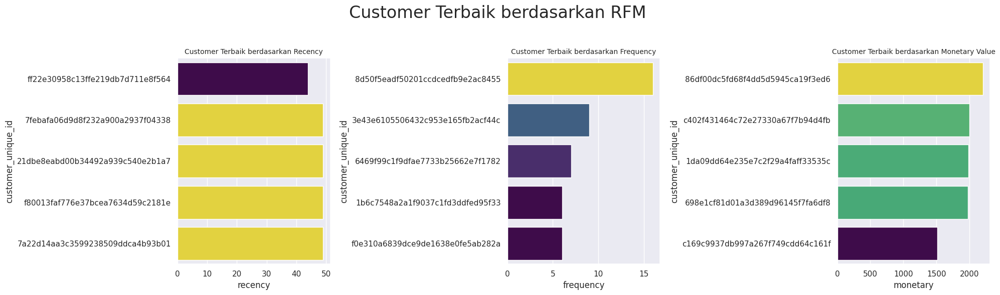

In [147]:
# Buat subplots (3 kolom, 1 baris)
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Judul umum
plt.suptitle("Customer Terbaik berdasarkan RFM", fontsize=24)

# Visualisasi Recency
sns.barplot(
    y="customer_unique_id",
    x="recency",
    data=rfm_df.sort_values(by="recency", ascending=True).head(5),
    palette="viridis",
    hue="recency",
    legend=False,
    ax=axes[0]
)
axes[0].set_title("Customer Terbaik berdasarkan Recency", fontsize=10)

# Visualisasi Frequency
sns.barplot(
    y="customer_unique_id",
    x="frequency",
    data=rfm_df.sort_values(by="frequency", ascending=False).head(5),
    palette="viridis",
    hue="frequency",
    legend=False,
    ax=axes[1]
)
axes[1].set_title("Customer Terbaik berdasarkan Frequency", fontsize=10)

# Visualisasi Monetary
sns.barplot(
    y="customer_unique_id",
    x="monetary",
    data=rfm_df.sort_values(by="monetary", ascending=False).head(5),
    palette="viridis",
    hue="monetary",
    legend=False,
    ax=axes[2]
)
axes[2].set_title("Customer Terbaik berdasarkan Monetary Value", fontsize=10)

# Menyesuaikan layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

##Pertanyaan 5: Dari mana saja pelanggan berasal dan bagaimana distribusi geografis pesanan?

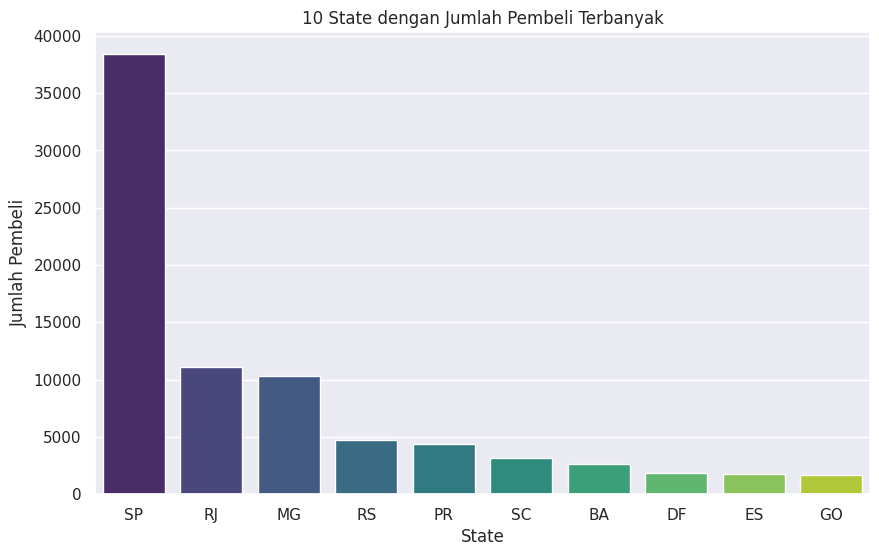

In [148]:
# Hitung jumlah pembeli per state
top_states = data['customer_state'].value_counts().nlargest(10)

# Plot Bar Chart
plt.figure(figsize=(10, 6))
sns.barplot(x=top_states.index, y=top_states.values, palette="viridis", hue=top_states.index, legend=False)

plt.xlabel("State")
plt.ylabel("Jumlah Pembeli")
plt.title("10 State dengan Jumlah Pembeli Terbanyak")
plt.show()

Pembeli didominasi oleh masyarakat yang berdomisili di Sao Paulo, Minas Gerais, Rio de Janeiro, Bahia, dan Pernambuco

In [149]:
# Gabungkan dataset utama dengan dataset geolocation berdasarkan zip code
df_geo = data[['customer_zip_code_prefix', 'customer_state']].drop_duplicates()
df_geo = df_geo.merge(geolocation, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix', how='left')

# Hapus nilai NaN jika ada
df_geo = df_geo.dropna(subset=['geolocation_lat', 'geolocation_lng'])

# Buat peta dengan titik tengah berdasarkan rata-rata koordinat
map_center = [df_geo['geolocation_lat'].mean(), df_geo['geolocation_lng'].mean()]
m = folium.Map(location=map_center, zoom_start=5)

# Tambahkan titik lokasi pembeli ke peta
for idx, row in df_geo.iterrows():
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=2,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(m)

# Tampilkan peta
m


## Conclusion

###Conclusion 1:

Seperti yang dipaparkan sebelumnya pertumbuhan pendapatan cukup signifikan berubah-ubah, namun jika dilihat lebih detail terdapat pola dari bulan **Januari 2018 hingga Agustus 2018** pertumbuhan pendapatan mulai mengalami **stagnasi**. Jika ini dibiarkan lebih lanjut, maka akan berpotensi mengalami penurunan. Meskipun terlihat mengalami penurunan pada persentase pertumbuhan pendapatan, bukan berarti pendapatan yang diterima juga mengalami penurunan. Pada grafik kedua bisnis mengalami trend kenaikan yang cukup sehat, namun 3 bulan terakhir terlihat tidak adanya kenaikan. Sehingga, perlu dilakukan beberapa strategi bisnis dan marketing agar bulan-bulan selanjutnya bisa memiliki pertumbuhan yang sehat.



###Conclusion 2:

Berdasarkan visualisasi dapat dilihat bahwa 10 kategori produk terlaris yang diperjual belikan adalah kebutuhan rumah tangga, kesehatan dan kecantikkan, peralatan olahraga, aksesoris komputer, dekorasi funiture, peralatan rumah tangga, jam tangan, telephone, mainan, dan automotif. Akan tetapi, produk-produk yang memiliki rating tinggi berbeda dari dari produk-produk yang merupakan produk terlaris. Adapun kategori produk yang memiliki rating tinggi yaitu DVD dan CD musik, baju anak-anak, funiture kamar, buku, makanan dan minuman, buku teknikal, bunga, aksesoris tas, baju olahraga, buku import. Hal ini menunjukkan tidak adanya korelasi antara rating dengan produk yang sering dibeli konsumen.

Saran:
1. **Kampanye Pemasaran Terfokus:** Buat kampanye pemasaran yang menyoroti produk dengan rating tinggi. Meskipun produk tersebut tidak terlaris, mereka mungkin memiliki potensi untuk menarik konsumen yang lebih memilih kualitas daripada kuantitas.
2. **Diversifikasi Penawaran:** Pertimbangkan untuk memperluas penawaran produk dengan menggabungkan produk terlaris dan produk dengan rating tinggi. Misalnya, jika ada permintaan untuk baju anak-anak yang memiliki rating tinggi, pertimbangkan untuk menambah variasi produk tersebut dalam penawaran.

###Conclusion 3:

Berdasarkan visualisasi dari tingkat pengiriman tepat waktu, tingkat pengiriman tepat waktu adalah **93,5%**. Karena pengiriman tepat waktu mengukur kemampuan perusahaan untuk mengirimkan pesanan tepat waktu, maka kita dapat menyimpulkan bahwa tingkat pengiriman tepat waktu sudah cukup baik. Tapi, kita bisa memperbaikinya dengan melakukan beberapa tindakan seperti:

1. **Optimalisasi Proses Logistik:** Tingkatkan efisiensi proses logistik melalui penerapan teknologi manajemen gudang dan sistem pelacakan, yang dapat mempercepat pemrosesan dan pengiriman barang.
2. **Pelatihan Sumber Daya Manusia:** Investasikan dalam pelatihan karyawan untuk meningkatkan keterampilan dan pemahaman mereka mengenai pentingnya pengiriman tepat waktu, yang berdampak pada kepuasan pelanggan.
3. **Peningkatan Komunikasi Pelanggan:** Perkuat komunikasi dengan pelanggan terkait status pengiriman, sehingga dapat mengelola ekspektasi dan meningkatkan loyalitas pelanggan.

###Conclusion 4

Berdasarkan analisis RFM (Recency, Frequency, Monetary), kita dapat mengidentifikasi pelanggan terbaik berdasarkan kebiasaan belanja mereka. Pelanggan dengan nilai **Recency tertinggi** adalah mereka yang baru saja melakukan transaksi, menunjukkan bahwa mereka masih aktif dan memiliki potensi besar untuk melakukan pembelian ulang. Oleh karena itu, strategi retargeting seperti email promosi atau diskon khusus dapat diterapkan untuk menjaga keterlibatan mereka. Selanjutnya, pelanggan dengan **Frequency tinggi** adalah mereka yang paling sering berbelanja, yang menunjukkan loyalitas terhadap platform. Untuk mempertahankan mereka, program loyalitas seperti poin reward, keanggotaan VIP, atau sistem referral dapat diterapkan. Sementara itu, pelanggan dengan **Monetary Value tertinggi** merupakan kontributor utama pendapatan perusahaan karena nilai transaksinya yang besar. Oleh karena itu, memberikan layanan eksklusif seperti akses ke produk premium, diskon spesial, atau layanan pelanggan prioritas dapat membantu mempertahankan mereka sebagai pelanggan tetap. Dengan menerapkan strategi yang tepat berdasarkan hasil analisis ini, bisnis dapat meningkatkan retensi pelanggan, memperkuat hubungan dengan pelanggan setia, dan mengoptimalkan pendapatan secara keseluruhan.

###Conclusion 5

Berdasarkan visualisasi dari profil pelanggan, profil demografis basis pelanggan adalah:

**10 states teratas** dengan jumlah pelanggan tertinggi adalah:

1. Sao Paulo
2. Minas Gerais
3. Rio de Janeiro
4. Bahia
5. Pernambuco
6. Ceara
7. Parana
8. Rio Grande do Sul
9. Santa Catarina
10. Federal District

Saran:
1. **Fokus Pemasaran:** Dengan mengetahui negara bagian dengan jumlah pelanggan tertinggi, perusahaan dapat mengarahkan upaya pemasaran dan promosi secara lebih efektif di wilayah-wilayah ini.
2. **Strategi Distribusi:** Optimalisasi strategi distribusi untuk memastikan ketersediaan produk di negara bagian dengan jumlah pelanggan tertinggi, guna meningkatkan kepuasan pelanggan.

##Simpan Semua Data

In [150]:
all_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85579 entries, 0 to 85578
Data columns (total 43 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       85579 non-null  object         
 1   customer_id                    85579 non-null  object         
 2   order_status                   85579 non-null  object         
 3   order_purchase_timestamp       85579 non-null  datetime64[ns] 
 4   order_approved_at              85567 non-null  datetime64[ns] 
 5   order_delivered_carrier_date   84794 non-null  datetime64[ns] 
 6   order_delivered_customer_date  85579 non-null  datetime64[ns] 
 7   order_estimated_delivery_date  85579 non-null  datetime64[ns] 
 8   date_ordinal                   85579 non-null  int64          
 9   shipping_time                  85579 non-null  timedelta64[ns]
 10  shipping_duration              85579 non-null  timedelta64[ns]
 11  es

In [ ]:
#Menyimpan data
all_df.to_csv("all_data.csv", index=False)